## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [2]:
plt.rcParams["figure.figsize"] = (9,12)

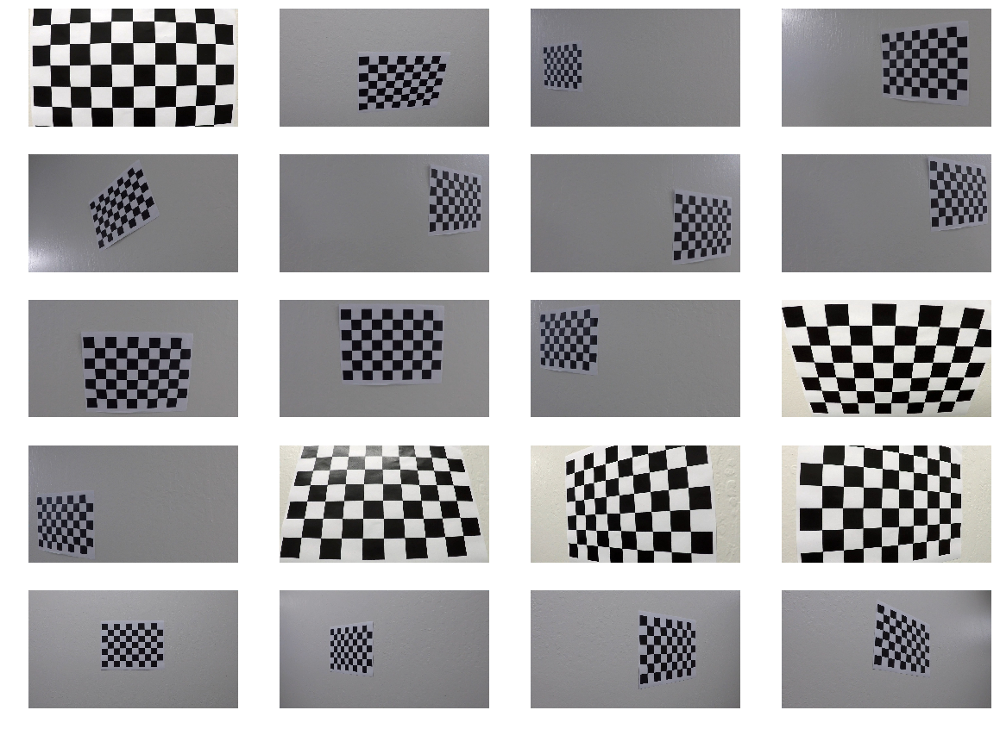

In [3]:
fnames = glob.glob('camera_cal/calibration*.jpg')

n_col = 4
n_row = int(np.ceil(len(fnames)/n_col))
f, axs = plt.subplots(n_row, n_col, figsize=(20,3*n_row))
axs = axs.ravel()
for i in range(len(axs)):
    if i < len(fnames):
        axs[i].axis('off')
        image = mpimg.imread(fnames[i])
        axs[i].imshow(image)
    else:
        f.delaxes(axs[i])

## Camera Calibration
Two main steps:
1. Use chessboard images to obtain image points and object points
2. Use OpenCV functions `cv2.calibrateCamera()` and `cv2.undistort()` to compute the calibration and undistortion.

### Image points and object points
I used OpenCV to convert the image to grayscale first, then used the functions `findChessboardCorners()` and `drawChessboardCorners()` to automatically find and draw corners in the chessboard images.

I observed that there are 9 inside corners in the row, 6 inside corners in the column, and stored them in `nx` and `ny`.

I start by preparing `object points`, which will be the (x, y, z) coordinates of the chessboard corners in the world. Here I am assuming the chessboard is fixed on the (x, y) plane at z=0, such that the object points are the same for each calibration image.  Thus, `objp` is just a replicated array of coordinates, and `objpoints` will be appended with a copy of it every time I successfully detect all chessboard corners in a test image.  `imgpoints` will be appended with the (x, y) pixel position of each of the corners in the image plane with each successful chessboard detection.|

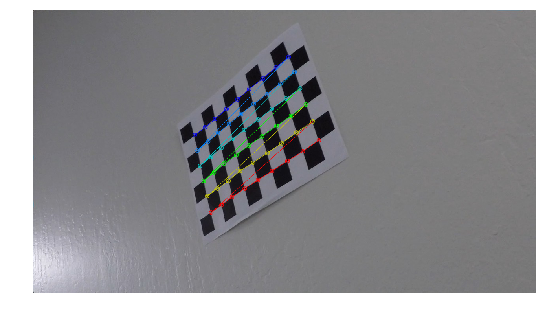

In [4]:
nx = 9
ny = 6

# Make a list of calibration images
img_index = 4
test_img = mpimg.imread(fnames[img_index])

# Convert to grayscale
gray = cv2.cvtColor(test_img, cv2.COLOR_RGB2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# If found, draw corners
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(test_img, (nx, ny), corners, ret)
    plt.axis('off')
    plt.imshow(test_img)

In [5]:
def generate_points(fnames):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    for fname in sorted(fnames):
        img = mpimg.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
        img_width, img_height = gray.shape[1], gray.shape[0]
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    return objpoints, imgpoints

objpoints, imgpoints = generate_points(fnames)

### Camera calibration matrix and distortion coefficient

I then used the output `objpoints` and `imgpoints` to compute the camera calibration and distortion coefficients using the `cv2.calibrateCamera()` function.  I applied this distortion correction to the test image using the `cv2.undistort()` function and obtained this result: 

In [6]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [7]:
def show_images(img1, img2, title1='Original Image', title2='New Image', fsize=30):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(title1, fontsize=fsize)
    ax2.imshow(img2, cmap='gray')
    ax2.set_title(title2, fontsize=fsize)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

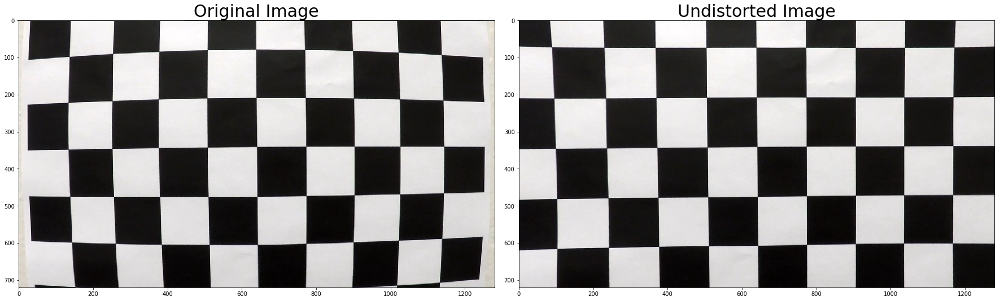

In [8]:
test_img = mpimg.imread(fnames[0])
undist = cv2.undistort(test_img, mtx, dist, None, mtx);
show_images(test_img, undist, title2='Undistorted Image')


## Pipeline (single images)

### Undistort image

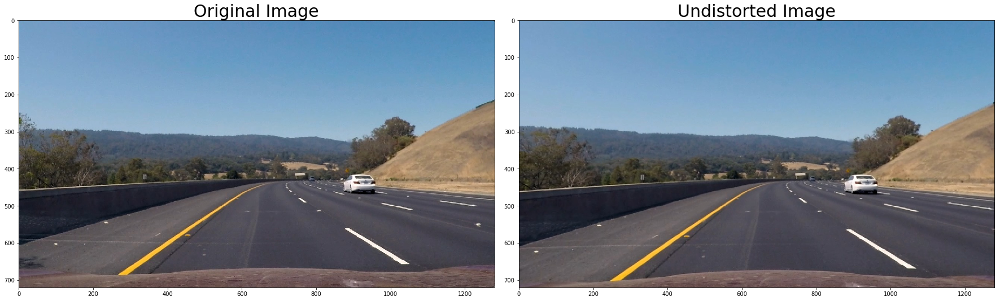

In [9]:
def undistort(img):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist
test_img = mpimg.imread('test_images/test3.jpg')
undist = undistort(test_img)
show_images(test_img, undist, title2='Undistorted Image')

### Color Threshold
Explore test images in different color spaces, observe which makes the lane lines stand out.

In [10]:
def convert_color_space(img, color_space='RGB'):
    if color_space != 'RGB':
        if color_space == 'HSV':
            new_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            new_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'LAB':
            new_image = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        elif color_space == 'HLS':
            new_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            new_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            new_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: new_image = np.copy(img) 
    return new_image

def show_color_spaces(img, color_spaces=['RGB', 'HSV', 'YUV', 'HLS', 'LUV', 'LAB'], cmap=None):
    
    for color in color_spaces:
        new_image = convert_color_space(img, color)
        f, axs = plt.subplots(1, 4, figsize=(16,3))
        axs = axs.ravel()
        for i in range(len(axs)):  
            axs[i].axis('off')
            if i == 0:
                axs[i].imshow(new_image)
            else:
                axs[i].imshow(new_image[:,:,i-1], cmap='gray')
            title = color if i == 0 else color[i-1] + ' Channel'
            axs[i].set_title(title)

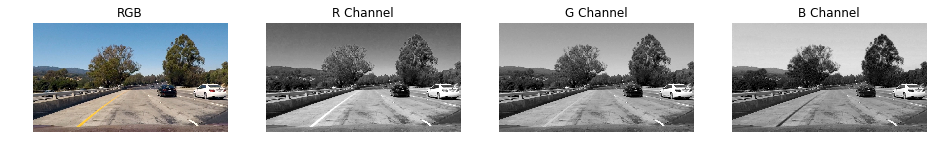

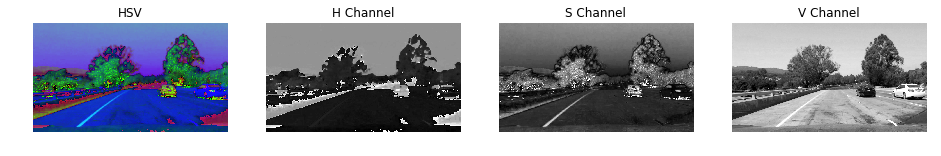

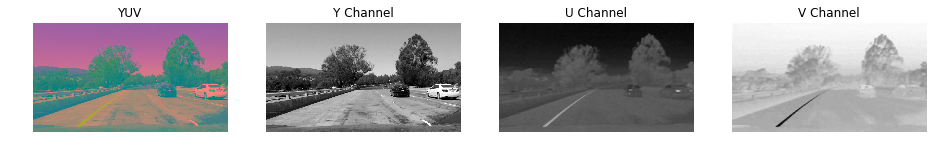

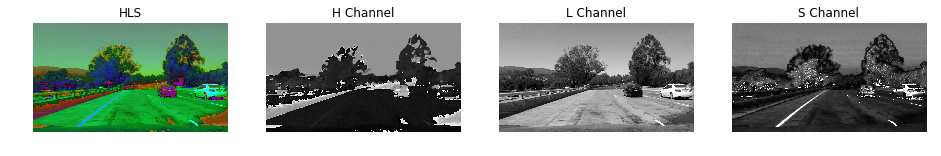

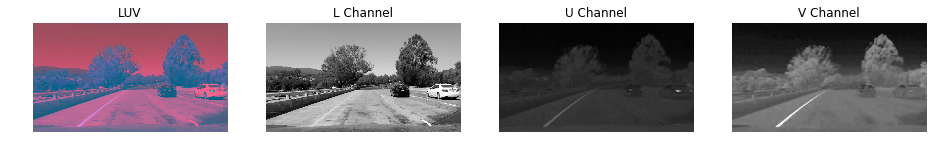

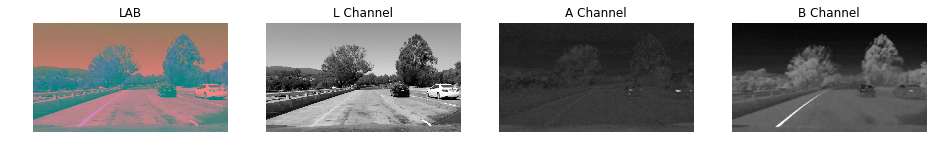

In [11]:
test_image = mpimg.imread('test_images/test1.jpg')
show_color_spaces(test_image)

In [12]:
def color_binary(img):
    
    hsv = convert_color_space(img, 'HSV')
    YELLOW_MIN1 = np.array([0, 90, 200],np.uint8)
    YELLOW_MAX1 = np.array([50, 255, 255],np.uint8)
    yellow1 = cv2.inRange(hsv, YELLOW_MIN1, YELLOW_MAX1)
    
    lab = convert_color_space(img, 'LAB')
    yellow2 = np.zeros_like(lab[:,:,2])
    yellow2[(lab[:,:,2] > 150)] = 1

    WHITE_MIN = np.array([0, 0, 220],np.uint8)
    WHITE_MAX = np.array([179, 70, 255],np.uint8)
    white = cv2.inRange(hsv, WHITE_MIN, WHITE_MAX)
    
    white2 = np.zeros_like(hsv[:,:,2])
    white2[(hsv[:,:,2] > 210)] = 1
    
    # Remove trees on roadside
    green = cv2.inRange(hsv, (30, 60, 100), (120, 255, 255))
    
    binary = np.zeros_like(hsv[:,:,0])
    binary[((yellow1 == 255) | (yellow2 == 1) | (white == 255) | (white2 == 1)) & (green==0)] = 1
    return binary

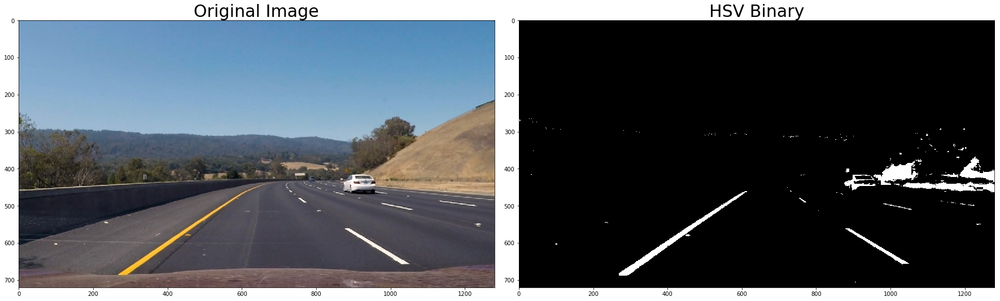

In [13]:
image = mpimg.imread('test_images/test3.jpg')
s_binary = color_binary(image)
show_images(image, s_binary, title2='HSV Binary')

### Gradient Threshold

Explore the effects of sobel gradient in x direction, y direction, magnitude, or specific direction.

In [14]:
def abs_sobel_thresh(channel, orient='x', sobel_kernel=3, thresh=(0, 255)):
    if orient == 'x':
        sobel = cv2.Sobel(channel, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(channel, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel>thresh[0]) & (scaled_sobel<thresh[1])] = 1
    return binary_output

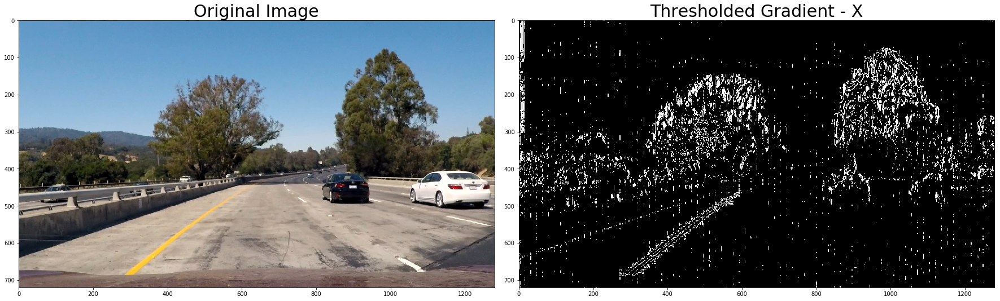

In [15]:
test_image = mpimg.imread('test_images/test1.jpg')
v_channel = convert_color_space(test_image, 'LUV')[:, :, 2]
v_binary = abs_sobel_thresh(v_channel, orient='x', thresh=(20, 50))
show_images(test_image, v_binary, title2='Thresholded Gradient - X')

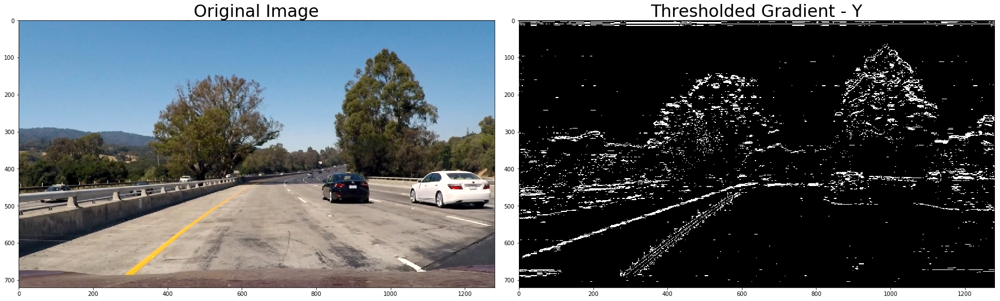

In [16]:
test_image = mpimg.imread('test_images/test1.jpg')
v_channel = convert_color_space(test_image, 'LUV')[:, :, 2]
v_binary = abs_sobel_thresh(v_channel, orient='y', thresh=(20, 50))

show_images(test_image, v_binary, title2='Thresholded Gradient - Y')

Y-gradient does a cleaner job for picking up the lane lines.

In [17]:
def mag_thresh(channel, x_ksize=3, y_ksize=3, mag_thresh=(0, 255)):
    sobelx = cv2.Sobel(channel, cv2.CV_64F, 1, 0, ksize=x_ksize)
    sobely = cv2.Sobel(channel, cv2.CV_64F, 0, 1, ksize=y_ksize)
    magnitude = (sobelx**2 + sobely**2)**.5
    scale_magnitude = np.uint8(255*magnitude/np.max(magnitude))
    binary_output = np.zeros_like(channel)
    binary_output[(scale_magnitude > mag_thresh[0]) & (scale_magnitude < mag_thresh[1])] = 1
    return binary_output

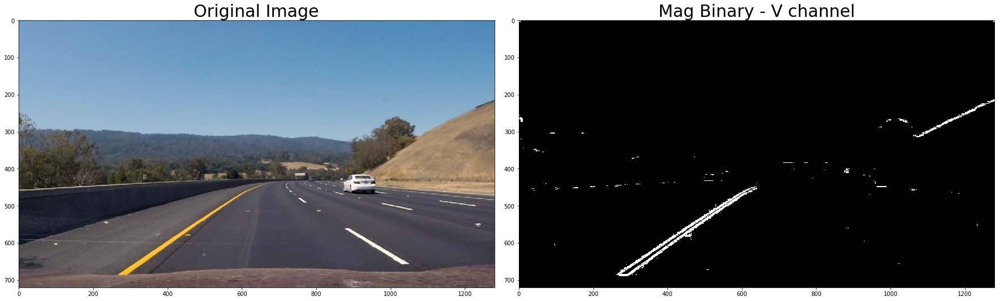

In [18]:
test_image = mpimg.imread('test_images/test3.jpg')
v_channel = convert_color_space(test_image, 'LUV')[:,:,2]
mag_binary = mag_thresh(v_channel, x_ksize=3, y_ksize=3, mag_thresh=(50,200))
show_images(test_image, mag_binary, title2='Mag Binary - V channel')

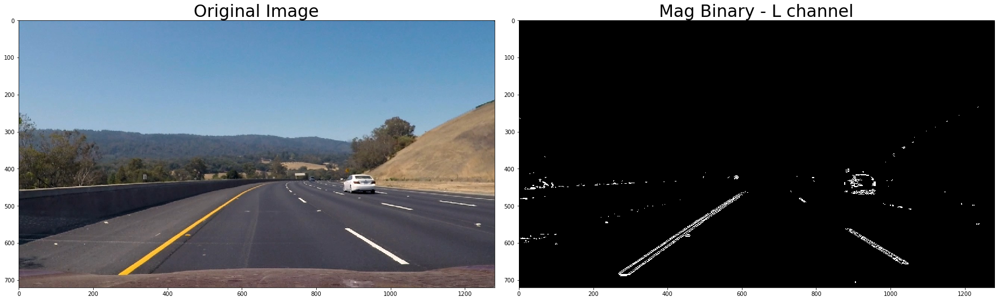

In [19]:
s_channel = convert_color_space(test_image, 'HLS')[:,:,2]
mag_binary = mag_thresh(s_channel, x_ksize=3, y_ksize=3, mag_thresh=(50,200))
show_images(test_image, mag_binary, title2='Mag Binary - L channel')

In [20]:
def dir_threshold(channel, sobel_kernel=3, thresh=(0, np.pi/2)):
    sobelx = cv2.Sobel(channel, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(channel, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    grad_direct = np.arctan2(abs_sobely, abs_sobelx)
    binary_output = np.zeros_like(channel)
    binary_output[(grad_direct > thresh[0]) & (grad_direct < thresh[1])] = 1
    return binary_output

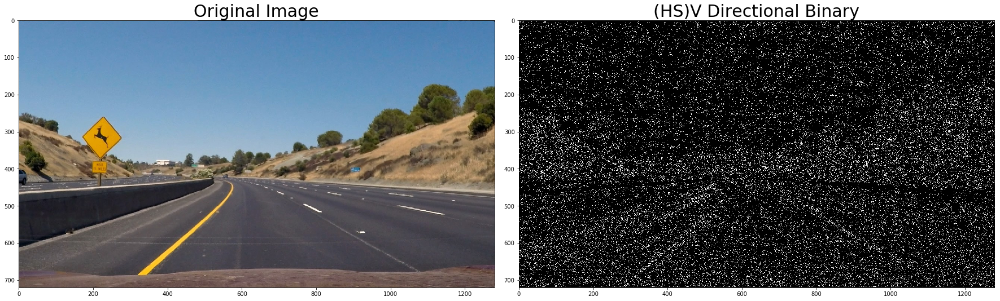

In [21]:
test_image = mpimg.imread('test_images/test2.jpg')
v_channel = convert_color_space(test_image, 'HSV')[:,:,2]
dir_binary = dir_threshold(v_channel, sobel_kernel=3, thresh=(0.9, 1.1))
show_images(test_image, dir_binary, title2='(HS)V Directional Binary')

In [22]:
def gradient_binary(img):
    luv = convert_color_space(img, 'LUV')
    luv = cv2.medianBlur(luv, 3)
    v_channel = luv[:,:,2]
    v_binary = mag_thresh(v_channel, x_ksize=3, y_ksize=3, mag_thresh=(50,200))
    s_channel = convert_color_space(img, 'HLS')[:,:,2]
    s_binary = mag_thresh(s_channel, x_ksize=3, y_ksize=3, mag_thresh=(50,200))
    binary = np.zeros_like(v_channel)
    binary[(s_binary == 1) | (v_binary == 1)] = 1
    return binary

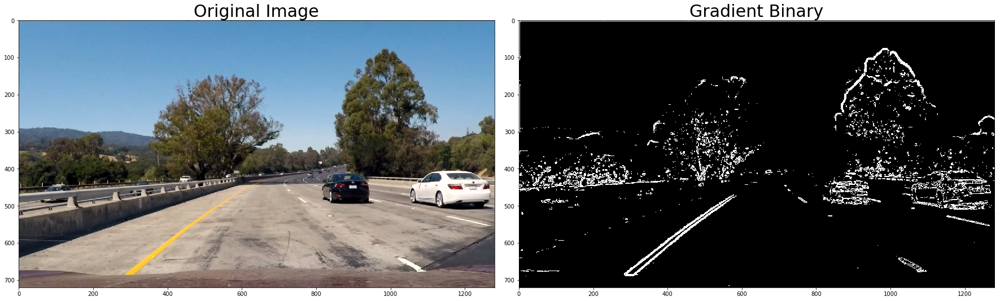

In [23]:
test_image = mpimg.imread('test_images/test1.jpg')
grad_binary = gradient_binary(test_image)
show_images(test_image, grad_binary, title2='Gradient Binary')

In [24]:
def thresholded_binary(img):
    cbinary = color_binary(img)
    grad_binary = gradient_binary(img)
    combined_binary = np.zeros_like(cbinary)
    combined_binary[(cbinary == 1) | (grad_binary == 1)] = 1
    return combined_binary

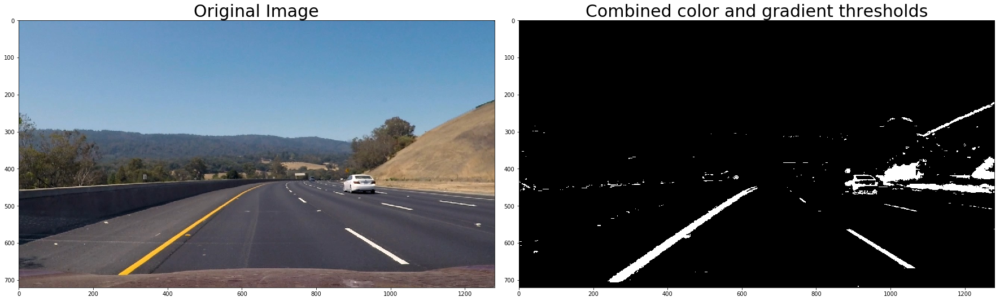

In [25]:
#test_image = mpimg.imread('test_images/test2.jpg')
thresh_binary = thresholded_binary(undist)
show_images(test_img, thresh_binary, title2='Combined color and gradient thresholds')

### Perspective Transform

In [26]:
img_size = (test_image.shape[1], test_image.shape[0])
min_y = img_size[1] *2 / 3
max_y = img_size[1] * 0.9
src = np.float32(
         [[(img_size[0] / 2) - 89, min_y],
         [(img_size[0] * 297/1280), max_y],
         [(img_size[0] * 1001/1280), max_y],
         [(img_size[0] / 2 + 90), min_y]])
dst = np.float32(
         [[(img_size[0] / 4), 0],
         [(img_size[0] / 4), max_y],
         [(img_size[0] * 3 / 4), max_y],
         [(img_size[0] * 3 / 4), 0]])
# print(src)
# print(dst)

def warper(undist, img_size, src=src, dst=dst):

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(undist, M, (img_size[1], img_size[0]))
    return warped, M, Minv

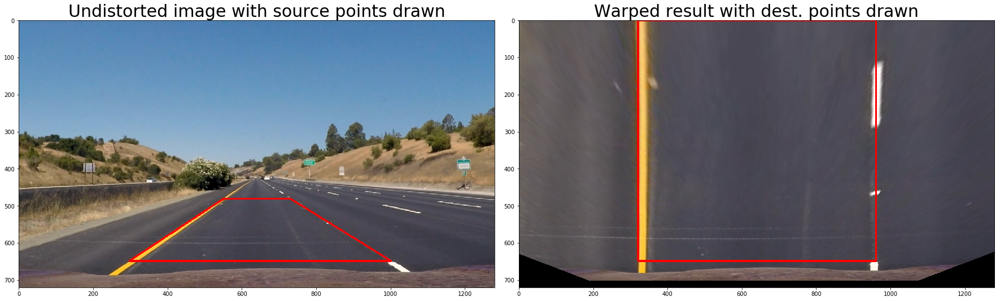

In [27]:
straight_image = mpimg.imread('test_images/straight_lines1.jpg')
# undist = cv2.undistort(test_image, mtx, dist, None, mtx);
straight_image_copy = straight_image.copy()
cv2.polylines(straight_image_copy,np.array([src], np.int32),True,(255,0,0), thickness=3)
straight_top_down, perspective_M, Minv = warper(straight_image, undist.shape)
straight_top_down_copy = straight_top_down.copy()
cv2.polylines(straight_top_down, np.array([dst], np.int32),True,(255,0,0), thickness=3)
show_images(straight_image_copy, straight_top_down, title1='Undistorted image with source points drawn', title2='Warped result with dest. points drawn', fsize=30)

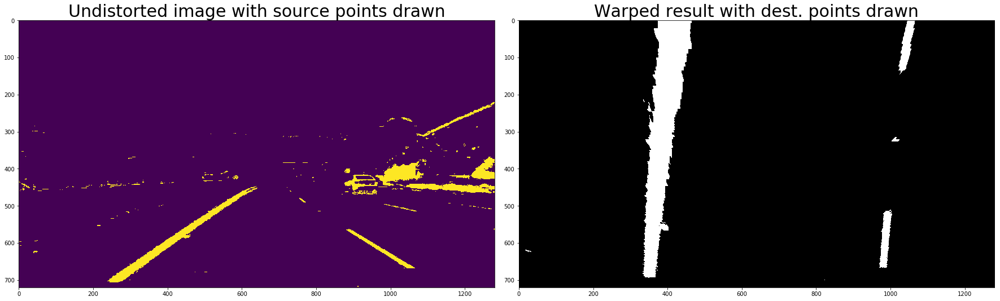

In [28]:
top_down, perspective_M, Minv = warper(thresh_binary, img_size=thresh_binary.shape)
show_images(thresh_binary, top_down, title1='Undistorted image with source points drawn', title2='Warped result with dest. points drawn', fsize=30)

## Detect Lane Pixels

I now have a thresholded warped image. Next, I need to decide explicitly which pixels are part of the lines, and which belong to the left line and which belong to the right line.

I first take a histogram along all the columns in the lower half of the image like following:

left X base: 353, right X base: 988


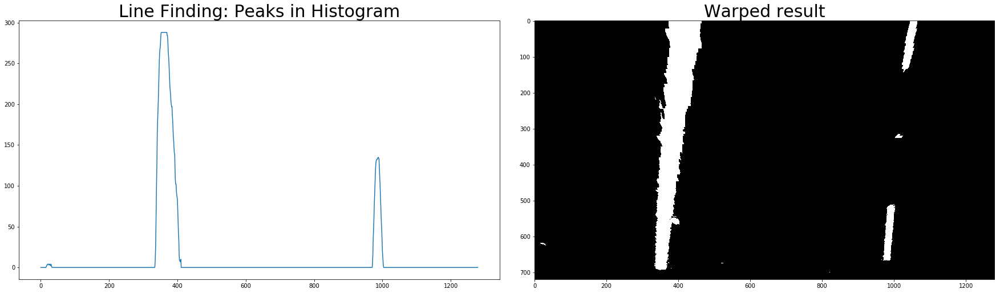

In [29]:
def x_bases(top_down_binary, plot=False):
    histogram = np.sum(top_down_binary[top_down_binary.shape[0]//2:int(top_down_binary.shape[0]*0.9),:], axis=0)
    
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    if plot:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 7))
        f.tight_layout()
        ax1.plot(histogram)
        ax1.set_title('Line Finding: Peaks in Histogram', fontsize=30)
        ax2.imshow(top_down_binary, cmap='gray')
        ax2.set_title('Warped result', fontsize=30)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    return leftx_base, rightx_base

leftx_base, rightx_base = x_bases(top_down, plot=True)
print('left X base: {}, right X base: {}'.format(leftx_base, rightx_base))


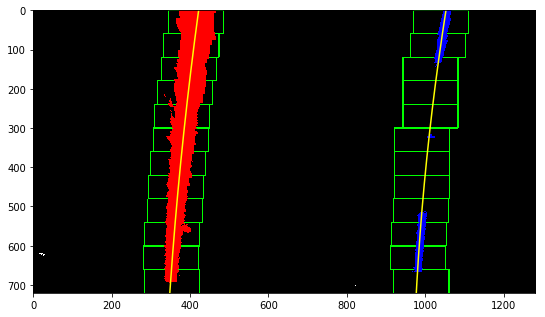

In [30]:
def nonzero(binary):
    nonzero = binary.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    return nonzeroy, nonzerox

def sliding_window(binary_warped, plot=False):
    # Choose the number of sliding windows
    nwindows = 12
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)

    nonzeroy, nonzerox = nonzero(binary_warped)
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Set the width of the windows +/- margin
    margin = 70
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        if plot:
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
            (0,255,0), 2) 
            if win_xright_high < binary_warped.shape[1] and win_xright_low > 0:
                cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
                (0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        if win_xright_high < binary_warped.shape[1] and win_xright_low > 0:
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        if win_xright_high < binary_warped.shape[1] and win_xright_low > 0:
            right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    return leftx, lefty, rightx, righty, out_img

def fit_lines(leftx, lefty, rightx, righty, out_img=None):
    
#     if len(leftx) == 0 or len(lefty) == 0 or len(rightx) == 0 or len(righty) == 0:
#         return None, None
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2) if (len(lefty)>0 and len(leftx)>0) else None
    right_fit = np.polyfit(righty, rightx, 2) if (len(righty)>0 and len(rightx)>0) else None
    
    if out_img is not None:
        #left_fit, right_fit = sliding_window(binary_warped)
        ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        out_img[lefty, leftx] = [255, 0, 0]
        out_img[righty, rightx] = [0, 0, 255]
        plt.imshow(out_img)
        plt.rcParams["figure.figsize"] = (10,5)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
    
    return left_fit, right_fit

leftx, lefty, rightx, righty, out_img = sliding_window(top_down, plot=True)
left_fit, right_fit = fit_lines(leftx, lefty, rightx, righty, out_img=out_img)

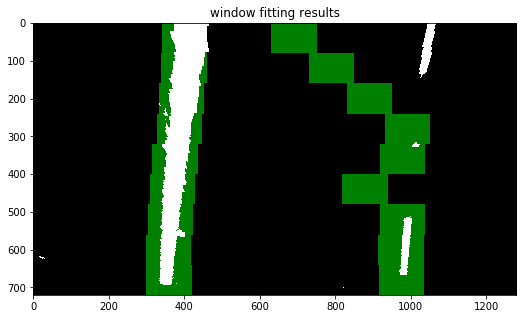

In [31]:
def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image):
    
    window_width = 50 
    window_height = 80 # Break image into 9 vertical layers since image height is 720
    margin = 100 # How much to slide left and right for searching

    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

def plot_window_centroids(window_centroids, warped):
    window_width = 120 
    window_height = 80 # Break image into 9 vertical layers since image height is 720
    margin = 100 # How much to slide left and right for searching
    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage= np.dstack((warped, warped, warped))*255 # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

    # Display the final results
    plt.imshow(output)
    plt.title('window fitting results')
    plt.show()
    
window_centroids = find_window_centroids(top_down)
plot_window_centroids(window_centroids, top_down)

Now I know where the lines are. For the next frame of video I don't need to do the blind search again, instead, I can just search in the margin around the preivous line position like this: 

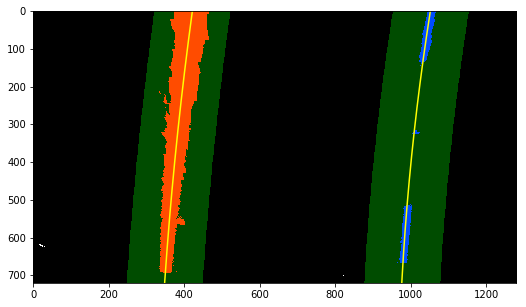

In [32]:
def look_ahead_search(binary_warped, left_fit, right_fit, plot=False):

    nonzeroy, nonzerox = nonzero(binary_warped)
    
    margin = 100
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
    if plot:
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                      ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                      ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        plt.imshow(result)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    return leftx, lefty, rightx, righty

leftx, lefty, rightx, righty = look_ahead_search(top_down, left_fit=left_fit, right_fit=right_fit, plot=True)

## Determine the Curvature and Center Offset

In [33]:
def get_curvature(left_fit, right_fit, y_eval):
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0]) if left_fit is not None else None
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0]) if right_fit is not None else None
    return left_curverad, right_curverad

left_fit, right_fit = fit_lines(leftx, lefty, rightx, righty)
left_curverad, right_curverad = get_curvature(left_fit, right_fit, top_down.shape[0])
print('curvature left: {} px, right: {} px'.format(left_curverad, right_curverad))

curvature left: 10583.82728510317 px, right: 7009.551973612055 px


In [34]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

def get_world_curvature(leftx, lefty, rightx, righty, y_eval):
    if leftx is None or lefty is None or rightx is None or righty is None:
        return None, None
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2) 
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2) 
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    return left_curverad, right_curverad

left_curverad, right_curverad = get_world_curvature(leftx, lefty, rightx, righty, top_down.shape[0])
print('curvature left: {} m, right: {} m'.format(left_curverad, right_curverad))

curvature left: 3452.9176017296077 m, right: 2292.6426481556796 m


In [35]:
def get_base_poses(left_fit, right_fit, y_eval):
    left_base_pose = left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2] if left_fit is not None else None
    right_base_pose = right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2] if right_fit is not None else None
    return left_base_pose, right_base_pose

def get_center_offset(left_base_pose, right_base_pose, image_width):
    if not left_base_pose or not right_base_pose:
        return None
    lane_center = (left_base_pose + right_base_pose) / 2 
    center_offset = (lane_center - image_width/2)*xm_per_pix
    return center_offset

left_base_pose, right_base_pose = get_base_poses(left_fit, right_fit, top_down.shape[0])
center_offset = get_center_offset(left_base_pose, right_base_pose, top_down.shape[1])
print('center offset {} m'.format(center_offset))

center offset 0.11978016308672829 m


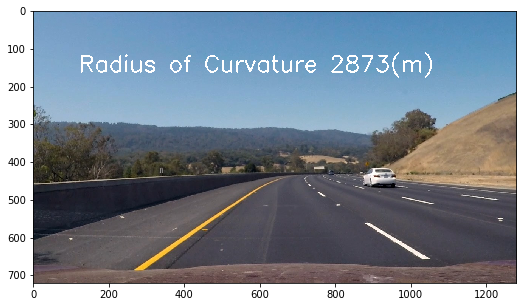

In [36]:
def draw_curvature(image, left_curverad, right_curverad):
    new_image = np.copy(image)
    curverad = (left_curverad + right_curverad)/2
    cv2.putText(new_image, 'Radius of Curvature {:.0f}(m)'.format(curverad), (120,160),
            fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 3)
    return new_image

curve_image = draw_curvature(test_img, left_curverad, right_curverad)
plt.imshow(curve_image)

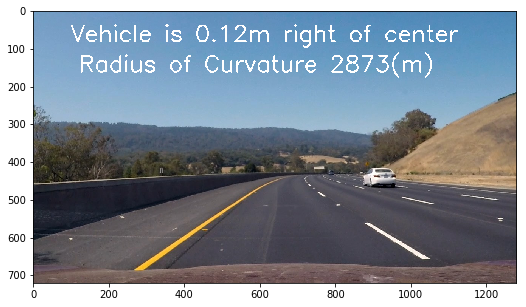

In [37]:
def draw_offset(image, center_offset):
    new_image = np.copy(image)
    side = 'left' if center_offset < 0 else 'right'
    cv2.putText(new_image, 'Vehicle is {:.2f}m {} of center'.format(abs(center_offset), side), (100,80),
                     fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 4)
    return new_image
curve_offset_image = draw_offset(curve_image, center_offset)
plt.imshow(curve_offset_image)  

## Inverse Transform

In [38]:
def map_lane(undist, warped, Minv, left_fit, right_fit):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    if left_fit is not None and right_fit is not None:
        ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
        

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    return result


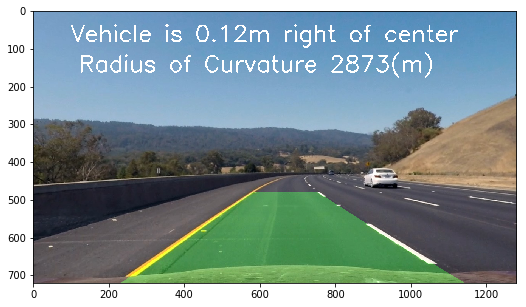

In [39]:
#test_image = mpimg.imread('test_images/test3.jpg')
#undist = cv2.undistort(test_image, mtx, dist, None, mtx)
result = map_lane(undist, top_down, Minv, left_fit, right_fit)
result = draw_curvature(result, left_curverad, right_curverad)
result = draw_offset(result, center_offset)
plt.imshow(result)

## Build an Advanced Lane Finding Pipeline

Build the pipeline and run the solution on all test images. Make copies into the test_images_output directory.

In [40]:
def pipeline(img):
    #1. Undistort
    undist = undistort(img)
    #2. Gradient thresholded binary
    thresholded = thresholded_binary(undist)
    #3. Warp to top down
    top_down, perspective_M, Minv = warper(thresholded, img.shape)
    #4. Search and fit polynomial lines
    leftx, lefty, rightx, righty, _ = sliding_window(top_down)
    left_fit, right_fit = fit_lines(leftx, lefty, rightx, righty)
    if left_fit is not None and right_fit is not None:
        #5. Calculate curvature and center offset
        left_curverad, right_curverad = get_world_curvature(leftx, lefty, rightx, righty, top_down.shape[0])
        left_base_pose, right_base_pose = get_base_poses(left_fit, right_fit, top_down.shape[0])
        center_offset = get_center_offset(left_base_pose, right_base_pose, top_down.shape[1])
        #6. Draw the lane on image (and inverse transform)
        new_image = map_lane(undist, top_down, Minv, left_fit, right_fit)
        #7. Draw curvature and offset
        new_image = draw_curvature(new_image, left_curverad, right_curverad)
        new_image = draw_offset(new_image, center_offset)
    else:
        new_image = img
    return new_image

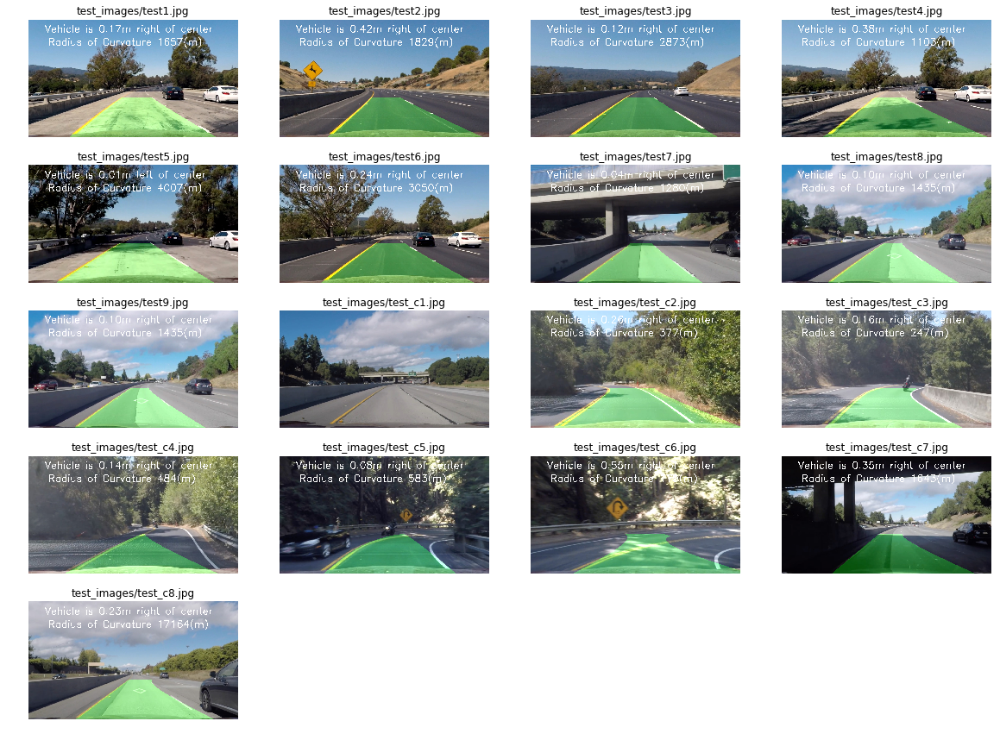

In [41]:
test_fnames = glob.glob('test_images/test*.jpg')
n_col = 4
n_row = int(np.ceil(len(test_fnames)/n_col))
f, axs = plt.subplots(n_row, n_col, figsize=(20,3*n_row))
axs = axs.ravel()
for i in range(len(axs)):
    if i < len(test_fnames):
        axs[i].axis('off')
        image = mpimg.imread(test_fnames[i])
        processed = pipeline(image)
        axs[i].imshow(processed)
        axs[i].set_title(test_fnames[i])
    else:
        f.delaxes(axs[i])

Next, I'll run the pipeline on a video stream.

To do it, I had to keep track of things like where my last several detections of the lines were, and what the curvature was, so I could properly treat new detections. 

I defined a `Line()` class to keep track of all the parameters I measure from frame to frame.

In [42]:
from collections import deque

class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # polynomial coefficients for the last n fits of the line
        self.recent_fitted = deque(maxlen=3)  
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        # number of failed detections
        self.num_undetected = 100

    
    def update_detected(self, line_fit, curvature, base_pose, linex, liney):
        self.detected = True
        self.diffs = line_fit - self.current_fit
        self.current_fit = np.array(line_fit)
        self.recent_fitted.append(line_fit)
        self.best_fit = sum(self.recent_fitted) / len(self.recent_fitted)
        self.radius_of_curvature = curvature
        self.line_base_pos = base_pose
        self.allx = linex
        self.ally = liney
        self.num_undetected = 0
    
    def update_undetected(self):
        self.detected = False
        self.num_undetected += 1

left_line = Line()
right_line = Line()

In [43]:
# Sanity checks
def similar_curve(left_curve, right_curve):
    diff = np.linalg.norm(left_curve - right_curve)
    #print('curve diff {}, left {}, right {}'.format(diff, left_curve, right_curve))
    return diff < 5000

def right_distance(left_fit, right_fit):
    diff = np.linalg.norm(left_fit - right_fit)
    #print('distance diff {}'.format(diff))
    return diff > 100 and diff < 1200

def parallel(left_fit, right_fit):
    left_slope = 2*left_fit[0]
    right_slope = 2*right_fit[0]
    diff = np.linalg.norm(left_slope - right_slope)
    #print('slope diff {}, left {}, right {}'.format(diff, left_slope, right_slope))
    return diff < 2e-3

def good_frame(left_fit, right_fit, left_curve, right_curve):
    curve_good = similar_curve(left_curverad, right_curverad)
    distance_good = right_distance(left_fit, right_fit)
    slope_good = parallel(left_fit, right_fit)
    #print('detection ' + str(curve_good) + ', ' + str(distance_good) + ', ' + str(slope_good))
    return curve_good and distance_good and slope_good


In [44]:
undetected_count = 0

def video_pipeline(img):

    def undetected(left_line, right_line, error_type):
        global undetected_count
        left_line.update_undetected()
        right_line.update_undetected()
        undetected_count += 1
        mpimg.imsave('./output_images/undetected_{}_{}.jpg'.format(error_type, undetected_count), img)
    #1. Undistort
    undist = undistort(img)
    
    #2. Gradient thresholded binary
    thresholded = thresholded_binary(undist)
    
    #3. Warp to top down
    top_down, perspective_M, Minv = warper(thresholded, img.shape)
    
    #4. Search and fit polynomial lines
    if left_line.num_undetected > 3 or right_line.num_undetected > 3:
        leftx, lefty, rightx, righty, _ = sliding_window(top_down)
        left_fit, right_fit = fit_lines(leftx, lefty, rightx, righty)
    else:
        leftx, lefty, rightx, righty = look_ahead_search(top_down, left_fit=left_line.best_fit, right_fit=right_line.best_fit)
        left_fit, right_fit = fit_lines(leftx, lefty, rightx, righty)
    
    if left_fit is not None and right_fit is not None:
        #5. Calculate curvature and center offset
        left_curverad, right_curverad = get_world_curvature(leftx, lefty, rightx, righty, top_down.shape[0])
        left_base_pose, right_base_pose = get_base_poses(left_fit, right_fit, top_down.shape[0])

        # sanity check
        if good_frame(left_fit, right_fit, left_curverad, right_curverad):
            #print('good frame')
            left_line.update_detected(left_fit, left_curverad, left_base_pose, leftx, lefty)
            right_line.update_detected(right_fit, right_curverad, right_base_pose, rightx, righty)
        else:
            print('undetected1')
            undetected(left_line, right_line,1)
    else:
        print('undetected2')
        undetected(left_line, right_line,2)
    
    new_image = img
    if left_line.best_fit is not None and right_line.best_fit is not None:
        center_offset = get_center_offset(left_line.line_base_pos, right_line.line_base_pos, top_down.shape[1])

        #6. Draw the lane on image (and inverse transform)
        new_image = map_lane(undist, top_down, Minv, left_line.best_fit, right_line.best_fit)
        #7. Draw curvature and offset
        new_image = draw_curvature(new_image, left_line.radius_of_curvature, right_line.radius_of_curvature)
        new_image = draw_offset(new_image, center_offset)
    return new_image

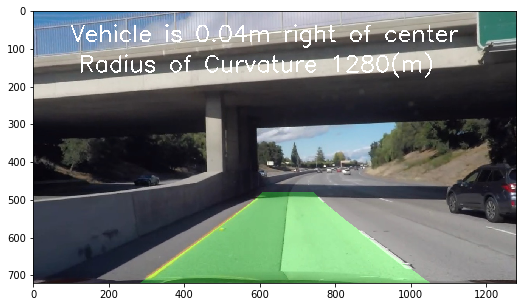

In [45]:
left_line = Line()
right_line = Line()
test_image = mpimg.imread('test_images/test7.jpg')
pipeline_result = video_pipeline(test_image)
plt.imshow(pipeline_result)

## Test on Videos

In [46]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [47]:

def test_video(src_path, dst_path, subclip_range=None):
    global left_line, right_line, undetected_count
    left_line = Line()
    right_line = Line()
    undetected_count = 0
    project_output = dst_path        

    if subclip_range is None:
        clip1 = VideoFileClip(src_path)
    else:
        clip1 = VideoFileClip(src_path).subclip(subclip_range)
    white_clip = clip1.fl_image(video_pipeline)
    
    %time white_clip.write_videofile(project_output, audio=False)

In [48]:
test_video('project_video.mp4','test_videos_output/project_video.mp4')

[MoviePy] >>>> Building video test_videos_output/project_video.mp4
[MoviePy] Writing video test_videos_output/project_video.mp4


 82%|████████▏ | 1038/1261 [02:38<00:34,  6.43it/s]

undetected1


 82%|████████▏ | 1039/1261 [02:38<01:14,  2.99it/s]

undetected1


 82%|████████▏ | 1040/1261 [02:39<01:38,  2.23it/s]

undetected1


 83%|████████▎ | 1041/1261 [02:40<01:55,  1.91it/s]

undetected1


100%|█████████▉| 1260/1261 [03:13<00:00,  7.20it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video.mp4 

CPU times: user 3min 21s, sys: 33.7 s, total: 3min 55s
Wall time: 3min 14s


In [49]:
test_video('challenge_video.mp4','test_videos_output/challenge_video.mp4')

[MoviePy] >>>> Building video test_videos_output/challenge_video.mp4
[MoviePy] Writing video test_videos_output/challenge_video.mp4


  0%|          | 0/485 [00:00<?, ?it/s]

undetected1


  1%|          | 4/485 [00:00<02:19,  3.45it/s]

undetected1


  1%|          | 6/485 [00:01<02:27,  3.26it/s]

undetected2


  1%|▏         | 7/485 [00:02<03:08,  2.53it/s]

undetected2


  2%|▏         | 8/485 [00:02<03:40,  2.17it/s]

undetected2


  2%|▏         | 9/485 [00:03<04:07,  1.92it/s]

undetected2


  2%|▏         | 10/485 [00:04<04:25,  1.79it/s]

undetected2


  2%|▏         | 11/485 [00:04<04:37,  1.71it/s]

undetected2


  2%|▏         | 12/485 [00:05<04:50,  1.63it/s]

undetected2


  3%|▎         | 13/485 [00:06<04:55,  1.60it/s]

undetected1


  4%|▍         | 20/485 [00:07<01:31,  5.06it/s]

undetected1


  5%|▍         | 22/485 [00:08<02:10,  3.55it/s]

undetected1


  5%|▍         | 23/485 [00:09<03:03,  2.52it/s]

undetected1


  5%|▍         | 24/485 [00:09<03:34,  2.15it/s]

undetected1


  5%|▌         | 25/485 [00:10<03:58,  1.93it/s]

undetected1


  6%|▌         | 27/485 [00:11<03:15,  2.34it/s]

undetected1


  6%|▌         | 28/485 [00:11<03:42,  2.05it/s]

undetected1


 27%|██▋       | 130/485 [00:25<00:42,  8.37it/s]

undetected1


 27%|██▋       | 131/485 [00:25<01:24,  4.18it/s]

undetected1


 27%|██▋       | 132/485 [00:26<01:51,  3.15it/s]

undetected1


 27%|██▋       | 133/485 [00:26<02:09,  2.71it/s]

undetected1


 28%|██▊       | 135/485 [00:27<01:56,  3.02it/s]

undetected1


 28%|██▊       | 136/485 [00:27<02:17,  2.54it/s]

undetected1


 28%|██▊       | 137/485 [00:28<02:38,  2.20it/s]

undetected1


 28%|██▊       | 138/485 [00:29<02:45,  2.09it/s]

undetected1


 29%|██▊       | 139/485 [00:29<02:54,  1.98it/s]

undetected1


 29%|██▉       | 140/485 [00:30<02:55,  1.96it/s]

undetected1


 29%|██▉       | 142/485 [00:30<02:21,  2.42it/s]

undetected1


 29%|██▉       | 143/485 [00:31<02:43,  2.10it/s]

undetected1


 30%|███       | 146/485 [00:32<01:51,  3.03it/s]

undetected1


 90%|█████████ | 437/485 [01:11<00:06,  6.89it/s]

undetected1


 90%|█████████ | 438/485 [01:12<00:14,  3.30it/s]

undetected1


 91%|█████████ | 439/485 [01:13<00:18,  2.45it/s]

undetected1


 91%|█████████ | 441/485 [01:14<00:16,  2.67it/s]

undetected1


 91%|█████████ | 442/485 [01:14<00:19,  2.20it/s]

undetected1


 91%|█████████▏| 443/485 [01:15<00:21,  1.97it/s]

undetected1


 92%|█████████▏| 444/485 [01:15<00:22,  1.86it/s]

undetected1


 92%|█████████▏| 445/485 [01:16<00:22,  1.78it/s]

undetected1


 92%|█████████▏| 447/485 [01:17<00:17,  2.21it/s]

undetected1


 92%|█████████▏| 448/485 [01:17<00:18,  2.00it/s]

undetected1


 93%|█████████▎| 449/485 [01:18<00:19,  1.84it/s]

undetected1


 93%|█████████▎| 450/485 [01:19<00:19,  1.75it/s]

undetected1


 93%|█████████▎| 451/485 [01:19<00:20,  1.65it/s]

undetected1


 93%|█████████▎| 452/485 [01:20<00:20,  1.63it/s]

undetected1


 94%|█████████▎| 454/485 [01:21<00:14,  2.11it/s]

undetected1


 94%|█████████▍| 455/485 [01:21<00:15,  1.96it/s]

undetected1


 94%|█████████▍| 456/485 [01:22<00:15,  1.84it/s]

undetected1


 94%|█████████▍| 457/485 [01:23<00:15,  1.76it/s]

undetected1


 95%|█████████▌| 462/485 [01:24<00:05,  3.96it/s]

undetected1


 95%|█████████▌| 463/485 [01:24<00:07,  2.77it/s]

undetected1


 96%|█████████▌| 465/485 [01:25<00:07,  2.84it/s]

undetected1


 96%|█████████▋| 467/485 [01:26<00:06,  2.91it/s]

undetected1


 96%|█████████▋| 468/485 [01:27<00:07,  2.30it/s]

undetected1


 97%|█████████▋| 469/485 [01:27<00:08,  1.99it/s]

undetected1


 97%|█████████▋| 470/485 [01:28<00:08,  1.83it/s]

undetected1


 97%|█████████▋| 471/485 [01:29<00:08,  1.74it/s]

undetected1


 97%|█████████▋| 472/485 [01:29<00:07,  1.69it/s]

undetected1


 98%|█████████▊| 473/485 [01:30<00:07,  1.67it/s]

undetected1


 98%|█████████▊| 474/485 [01:30<00:06,  1.66it/s]

undetected1


 98%|█████████▊| 475/485 [01:31<00:06,  1.65it/s]

undetected1


 98%|█████████▊| 476/485 [01:32<00:05,  1.63it/s]

undetected1


 98%|█████████▊| 477/485 [01:32<00:04,  1.62it/s]

undetected1


 99%|█████████▉| 479/485 [01:33<00:02,  2.09it/s]

undetected1


 99%|█████████▉| 481/485 [01:34<00:01,  2.48it/s]

undetected1


 99%|█████████▉| 482/485 [01:34<00:01,  2.20it/s]

undetected1


100%|█████████▉| 483/485 [01:35<00:00,  2.01it/s]

undetected1


100%|█████████▉| 484/485 [01:36<00:00,  1.93it/s]

undetected1


100%|██████████| 485/485 [01:36<00:00,  1.83it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/challenge_video.mp4 

CPU times: user 1min 43s, sys: 11.1 s, total: 1min 54s
Wall time: 1min 37s


In [50]:
test_video('harder_challenge_video.mp4','test_videos_output/harder_challenge_video.mp4')

[MoviePy] >>>> Building video test_videos_output/harder_challenge_video.mp4
[MoviePy] Writing video test_videos_output/harder_challenge_video.mp4


  0%|          | 0/1200 [00:00<?, ?it/s]

undetected1


  0%|          | 1/1200 [00:00<14:48,  1.35it/s]

undetected1


  0%|          | 2/1200 [00:01<14:54,  1.34it/s]

undetected1


  0%|          | 3/1200 [00:02<14:53,  1.34it/s]

undetected1


  0%|          | 4/1200 [00:02<14:54,  1.34it/s]

undetected1


  0%|          | 5/1200 [00:03<15:13,  1.31it/s]

undetected1


  0%|          | 6/1200 [00:04<15:26,  1.29it/s]

undetected1


  1%|          | 7/1200 [00:05<15:28,  1.28it/s]

undetected1


  1%|          | 8/1200 [00:06<16:05,  1.23it/s]

undetected1


  1%|          | 9/1200 [00:07<16:07,  1.23it/s]

undetected1


  1%|          | 10/1200 [00:07<15:56,  1.24it/s]

undetected1


  1%|          | 11/1200 [00:08<15:42,  1.26it/s]

undetected1


  1%|          | 12/1200 [00:09<15:43,  1.26it/s]

undetected1


  1%|          | 13/1200 [00:10<15:26,  1.28it/s]

undetected1


  1%|          | 14/1200 [00:10<15:17,  1.29it/s]

undetected1


  1%|▏         | 15/1200 [00:11<15:15,  1.29it/s]

undetected1


  3%|▎         | 37/1200 [00:15<03:00,  6.43it/s]

undetected1


  3%|▎         | 38/1200 [00:16<06:20,  3.05it/s]

undetected1


  3%|▎         | 39/1200 [00:17<08:48,  2.20it/s]

undetected1


  3%|▎         | 40/1200 [00:18<10:29,  1.84it/s]

undetected1


  3%|▎         | 41/1200 [00:18<11:39,  1.66it/s]

undetected1


  4%|▎         | 42/1200 [00:19<12:27,  1.55it/s]

undetected1


  4%|▎         | 44/1200 [00:20<10:12,  1.89it/s]

undetected1


  4%|▍         | 45/1200 [00:21<11:33,  1.66it/s]

undetected1


  4%|▍         | 46/1200 [00:22<12:30,  1.54it/s]

undetected1


  4%|▍         | 47/1200 [00:22<13:09,  1.46it/s]

undetected1


  4%|▍         | 48/1200 [00:23<13:37,  1.41it/s]

undetected1


  4%|▍         | 49/1200 [00:24<13:58,  1.37it/s]

undetected1


  4%|▍         | 51/1200 [00:25<10:50,  1.77it/s]

undetected1


  4%|▍         | 52/1200 [00:26<12:18,  1.56it/s]

undetected1


  4%|▍         | 53/1200 [00:26<13:03,  1.46it/s]

undetected1


  4%|▍         | 54/1200 [00:27<13:36,  1.40it/s]

undetected1


  5%|▍         | 59/1200 [00:29<05:33,  3.42it/s]

undetected1


  5%|▌         | 60/1200 [00:29<08:13,  2.31it/s]

undetected1


  5%|▌         | 61/1200 [00:30<09:49,  1.93it/s]

undetected1


  5%|▌         | 62/1200 [00:31<11:02,  1.72it/s]

undetected1


 10%|▉         | 115/1200 [00:40<02:49,  6.40it/s]

undetected1


 10%|▉         | 117/1200 [00:40<05:02,  3.58it/s]

undetected1


 10%|█         | 120/1200 [00:42<05:26,  3.31it/s]

undetected1


 10%|█         | 121/1200 [00:42<07:54,  2.27it/s]

undetected1


 10%|█         | 123/1200 [00:43<07:39,  2.34it/s]

undetected1


 10%|█         | 124/1200 [00:44<09:27,  1.89it/s]

undetected1


 10%|█         | 126/1200 [00:45<08:31,  2.10it/s]

undetected1


 11%|█         | 127/1200 [00:46<09:55,  1.80it/s]

undetected1


 11%|█         | 128/1200 [00:47<11:11,  1.60it/s]

undetected1


 11%|█         | 130/1200 [00:48<09:09,  1.95it/s]

undetected1


 11%|█         | 131/1200 [00:48<10:34,  1.68it/s]

undetected1


 11%|█         | 132/1200 [00:49<11:38,  1.53it/s]

undetected1


 11%|█         | 133/1200 [00:50<12:15,  1.45it/s]

undetected1


 11%|█         | 134/1200 [00:51<12:39,  1.40it/s]

undetected1


 11%|█▏        | 136/1200 [00:52<10:02,  1.77it/s]

undetected1


 11%|█▏        | 137/1200 [00:52<11:10,  1.59it/s]

undetected1


 12%|█▏        | 138/1200 [00:53<11:48,  1.50it/s]

undetected1


 12%|█▏        | 139/1200 [00:54<12:11,  1.45it/s]

undetected1


 12%|█▏        | 141/1200 [00:55<09:35,  1.84it/s]

undetected1


 12%|█▏        | 142/1200 [00:55<10:32,  1.67it/s]

undetected1


 12%|█▏        | 144/1200 [00:56<08:46,  2.01it/s]

undetected1


 13%|█▎        | 161/1200 [00:59<02:27,  7.03it/s]

undetected1


 14%|█▎        | 162/1200 [01:00<05:21,  3.23it/s]

undetected1


 14%|█▎        | 163/1200 [01:01<07:25,  2.33it/s]

undetected1


 14%|█▎        | 164/1200 [01:02<08:55,  1.93it/s]

undetected1


 14%|█▍        | 165/1200 [01:02<10:03,  1.72it/s]

undetected1


 14%|█▍        | 166/1200 [01:03<11:15,  1.53it/s]

undetected1


 14%|█▍        | 170/1200 [01:04<05:34,  3.08it/s]

undetected1


 14%|█▍        | 171/1200 [01:05<07:30,  2.29it/s]

undetected1


 14%|█▍        | 172/1200 [01:06<08:55,  1.92it/s]

undetected1


 14%|█▍        | 173/1200 [01:06<09:47,  1.75it/s]

undetected1


 14%|█▍        | 174/1200 [01:07<10:27,  1.63it/s]

undetected1


 15%|█▍        | 175/1200 [01:08<10:59,  1.56it/s]

undetected1


 15%|█▍        | 176/1200 [01:09<11:35,  1.47it/s]

undetected1


 15%|█▍        | 177/1200 [01:09<11:59,  1.42it/s]

undetected1


 15%|█▍        | 178/1200 [01:10<12:07,  1.40it/s]

undetected1


 15%|█▍        | 179/1200 [01:11<12:22,  1.37it/s]

undetected1


 15%|█▌        | 180/1200 [01:12<12:37,  1.35it/s]

undetected1


 15%|█▌        | 181/1200 [01:12<12:27,  1.36it/s]

undetected1


 15%|█▌        | 182/1200 [01:13<12:35,  1.35it/s]

undetected1


 15%|█▌        | 183/1200 [01:14<12:31,  1.35it/s]

undetected1


 15%|█▌        | 185/1200 [01:15<09:33,  1.77it/s]

undetected1


 16%|█▌        | 187/1200 [01:16<08:06,  2.08it/s]

undetected1


 16%|█▌        | 188/1200 [01:16<09:35,  1.76it/s]

undetected1


 16%|█▌        | 190/1200 [01:17<08:12,  2.05it/s]

undetected1


 16%|█▌        | 191/1200 [01:18<09:31,  1.77it/s]

undetected1


 16%|█▌        | 192/1200 [01:19<10:24,  1.62it/s]

undetected1


 16%|█▌        | 193/1200 [01:20<10:59,  1.53it/s]

undetected1


 16%|█▌        | 194/1200 [01:20<11:27,  1.46it/s]

undetected1


 16%|█▋        | 195/1200 [01:21<11:43,  1.43it/s]

undetected1


 16%|█▋        | 198/1200 [01:22<07:02,  2.37it/s]

undetected1


 17%|█▋        | 199/1200 [01:23<08:21,  1.99it/s]

undetected1


 17%|█▋        | 200/1200 [01:24<09:24,  1.77it/s]

undetected1


 17%|█▋        | 201/1200 [01:24<10:11,  1.63it/s]

undetected1


 17%|█▋        | 202/1200 [01:25<10:53,  1.53it/s]

undetected1


 18%|█▊        | 212/1200 [01:27<02:55,  5.63it/s]

undetected1


 18%|█▊        | 215/1200 [01:28<04:16,  3.84it/s]

undetected1


 18%|█▊        | 218/1200 [01:29<04:47,  3.42it/s]

undetected1


 18%|█▊        | 219/1200 [01:30<07:09,  2.29it/s]

undetected1


 18%|█▊        | 221/1200 [01:31<07:10,  2.28it/s]

undetected1


 18%|█▊        | 222/1200 [01:32<08:47,  1.85it/s]

undetected1


 19%|█▉        | 225/1200 [01:33<06:22,  2.55it/s]

undetected1


 19%|█▉        | 226/1200 [01:34<08:17,  1.96it/s]

undetected1


 19%|█▉        | 227/1200 [01:35<09:39,  1.68it/s]

undetected1


 19%|█▉        | 228/1200 [01:35<10:34,  1.53it/s]

undetected1


 19%|█▉        | 230/1200 [01:36<08:44,  1.85it/s]

undetected1


 19%|█▉        | 231/1200 [01:37<09:45,  1.65it/s]

undetected1


 19%|█▉        | 232/1200 [01:38<10:36,  1.52it/s]

undetected1


 19%|█▉        | 233/1200 [01:39<11:04,  1.46it/s]

undetected1


 20%|█▉        | 234/1200 [01:39<11:29,  1.40it/s]

undetected1


 20%|█▉        | 235/1200 [01:40<11:41,  1.38it/s]

undetected1


 20%|█▉        | 236/1200 [01:41<11:46,  1.36it/s]

undetected1


 20%|█▉        | 237/1200 [01:42<11:52,  1.35it/s]

undetected1


 20%|█▉        | 238/1200 [01:43<11:59,  1.34it/s]

undetected1


 20%|██        | 240/1200 [01:43<09:16,  1.72it/s]

undetected1


 20%|██        | 241/1200 [01:44<10:06,  1.58it/s]

undetected1


 20%|██        | 242/1200 [01:45<10:42,  1.49it/s]

undetected1


 20%|██        | 243/1200 [01:46<11:05,  1.44it/s]

undetected1


 23%|██▎       | 272/1200 [01:51<02:20,  6.60it/s]

undetected1


 23%|██▎       | 273/1200 [01:52<04:52,  3.17it/s]

undetected1


 23%|██▎       | 274/1200 [01:52<06:44,  2.29it/s]

undetected1


 23%|██▎       | 275/1200 [01:53<08:27,  1.82it/s]

undetected1


 23%|██▎       | 276/1200 [01:54<10:10,  1.51it/s]

undetected1


 23%|██▎       | 278/1200 [01:56<09:37,  1.60it/s]

undetected1


 23%|██▎       | 279/1200 [01:56<11:00,  1.39it/s]

undetected1


 23%|██▎       | 280/1200 [01:57<11:19,  1.35it/s]

undetected1


 24%|██▎       | 283/1200 [01:58<06:48,  2.24it/s]

undetected1


 24%|██▍       | 285/1200 [01:59<06:21,  2.40it/s]

undetected1


 24%|██▍       | 286/1200 [02:00<07:42,  1.98it/s]

undetected1


 24%|██▍       | 287/1200 [02:01<08:37,  1.76it/s]

undetected1


 24%|██▍       | 289/1200 [02:01<07:06,  2.14it/s]

undetected1


 24%|██▍       | 291/1200 [02:02<06:24,  2.36it/s]

undetected1


 24%|██▍       | 292/1200 [02:03<07:39,  1.97it/s]

undetected1


 25%|██▍       | 295/1200 [02:04<06:00,  2.51it/s]

undetected1


 25%|██▌       | 300/1200 [02:06<03:32,  4.24it/s]

undetected1


 25%|██▌       | 301/1200 [02:06<05:40,  2.64it/s]

undetected1


 25%|██▌       | 302/1200 [02:07<07:11,  2.08it/s]

undetected1


 25%|██▌       | 303/1200 [02:08<07:50,  1.90it/s]

undetected1


 25%|██▌       | 304/1200 [02:08<08:34,  1.74it/s]

undetected1


 25%|██▌       | 305/1200 [02:09<09:02,  1.65it/s]

undetected1


 26%|██▌       | 306/1200 [02:10<09:27,  1.58it/s]

undetected1


 26%|██▌       | 307/1200 [02:10<09:46,  1.52it/s]

undetected1


 26%|██▌       | 308/1200 [02:11<10:22,  1.43it/s]

undetected1


 26%|██▌       | 311/1200 [02:12<06:28,  2.29it/s]

undetected1


 26%|██▌       | 312/1200 [02:13<07:47,  1.90it/s]

undetected1


 27%|██▋       | 326/1200 [02:15<02:01,  7.20it/s]

undetected1


 27%|██▋       | 327/1200 [02:16<04:09,  3.50it/s]

undetected1


 27%|██▋       | 328/1200 [02:17<05:42,  2.54it/s]

undetected1


 27%|██▋       | 329/1200 [02:17<06:52,  2.11it/s]

undetected1


 28%|██▊       | 341/1200 [02:20<02:21,  6.09it/s]

undetected1


 29%|██▊       | 344/1200 [02:21<03:26,  4.15it/s]

undetected1


 29%|██▉       | 348/1200 [02:22<03:25,  4.14it/s]

undetected1


 29%|██▉       | 349/1200 [02:23<05:26,  2.61it/s]

undetected1


 29%|██▉       | 350/1200 [02:23<06:56,  2.04it/s]

undetected1


 29%|██▉       | 353/1200 [02:25<05:07,  2.75it/s]

undetected1


 30%|██▉       | 354/1200 [02:25<06:49,  2.06it/s]

undetected1


 30%|██▉       | 355/1200 [02:26<07:57,  1.77it/s]

undetected1


 30%|██▉       | 356/1200 [02:27<08:57,  1.57it/s]

undetected1


 30%|██▉       | 357/1200 [02:28<09:26,  1.49it/s]

undetected1


 31%|███       | 368/1200 [02:30<02:45,  5.04it/s]

undetected1


 34%|███▍      | 411/1200 [02:40<02:35,  5.08it/s]

undetected1


 34%|███▍      | 412/1200 [02:40<05:09,  2.54it/s]

undetected1


 34%|███▍      | 413/1200 [02:41<06:53,  1.90it/s]

undetected1


 34%|███▍      | 414/1200 [02:42<08:11,  1.60it/s]

undetected1


 35%|███▍      | 416/1200 [02:43<07:00,  1.87it/s]

undetected1


 35%|███▍      | 417/1200 [02:44<07:57,  1.64it/s]

undetected1


 35%|███▍      | 418/1200 [02:45<08:42,  1.50it/s]

undetected1


 35%|███▌      | 420/1200 [02:46<07:11,  1.81it/s]

undetected1


 35%|███▌      | 421/1200 [02:46<07:53,  1.64it/s]

undetected1


 35%|███▌      | 422/1200 [02:47<08:34,  1.51it/s]

undetected1


 35%|███▌      | 423/1200 [02:48<09:07,  1.42it/s]

undetected1


 36%|███▌      | 432/1200 [02:50<02:42,  4.72it/s]

undetected1


 36%|███▌      | 433/1200 [02:51<04:57,  2.58it/s]

undetected1


 36%|███▌      | 434/1200 [02:52<06:32,  1.95it/s]

undetected1


 36%|███▋      | 435/1200 [02:53<07:27,  1.71it/s]

undetected1


 36%|███▋      | 436/1200 [02:53<08:06,  1.57it/s]

undetected1


 36%|███▋      | 437/1200 [02:54<08:35,  1.48it/s]

undetected1


 36%|███▋      | 438/1200 [02:55<08:53,  1.43it/s]

undetected1


 37%|███▋      | 439/1200 [02:56<09:06,  1.39it/s]

undetected1


 37%|███▋      | 440/1200 [02:56<09:19,  1.36it/s]

undetected1


 37%|███▋      | 441/1200 [02:57<09:22,  1.35it/s]

undetected1


 37%|███▋      | 442/1200 [02:58<09:25,  1.34it/s]

undetected1


 37%|███▋      | 443/1200 [02:59<09:27,  1.33it/s]

undetected1


 37%|███▋      | 444/1200 [02:59<09:35,  1.31it/s]

undetected1


 37%|███▋      | 445/1200 [03:00<09:39,  1.30it/s]

undetected1


 37%|███▋      | 446/1200 [03:01<09:44,  1.29it/s]

undetected1


 37%|███▋      | 447/1200 [03:02<09:46,  1.28it/s]

undetected1


 37%|███▋      | 448/1200 [03:03<09:50,  1.27it/s]

undetected1


 37%|███▋      | 449/1200 [03:03<09:53,  1.27it/s]

undetected1


 38%|███▊      | 450/1200 [03:04<09:48,  1.27it/s]

undetected1


 38%|███▊      | 451/1200 [03:05<09:32,  1.31it/s]

undetected1


 38%|███▊      | 452/1200 [03:06<09:27,  1.32it/s]

undetected1


 38%|███▊      | 453/1200 [03:06<09:22,  1.33it/s]

undetected1


 38%|███▊      | 454/1200 [03:07<09:20,  1.33it/s]

undetected1


 38%|███▊      | 455/1200 [03:08<09:18,  1.33it/s]

undetected1


 38%|███▊      | 456/1200 [03:09<09:14,  1.34it/s]

undetected1


 38%|███▊      | 457/1200 [03:09<09:18,  1.33it/s]

undetected1


 38%|███▊      | 458/1200 [03:10<09:32,  1.30it/s]

undetected1


 38%|███▊      | 459/1200 [03:11<09:26,  1.31it/s]

undetected1


 38%|███▊      | 460/1200 [03:12<09:32,  1.29it/s]

undetected1


 38%|███▊      | 461/1200 [03:13<09:33,  1.29it/s]

undetected1


 38%|███▊      | 462/1200 [03:13<09:39,  1.27it/s]

undetected1


 39%|███▊      | 463/1200 [03:14<09:42,  1.27it/s]

undetected1


 39%|███▊      | 464/1200 [03:15<09:48,  1.25it/s]

undetected1


 39%|███▉      | 465/1200 [03:16<09:43,  1.26it/s]

undetected1


 39%|███▉      | 466/1200 [03:17<09:37,  1.27it/s]

undetected1


 39%|███▉      | 467/1200 [03:17<09:35,  1.27it/s]

undetected1


 39%|███▉      | 468/1200 [03:18<09:36,  1.27it/s]

undetected1


 39%|███▉      | 469/1200 [03:19<09:37,  1.27it/s]

undetected2


 39%|███▉      | 470/1200 [03:20<09:37,  1.26it/s]

undetected2


 39%|███▉      | 471/1200 [03:20<09:25,  1.29it/s]

undetected2


 39%|███▉      | 472/1200 [03:21<09:17,  1.31it/s]

undetected2


 39%|███▉      | 473/1200 [03:22<09:21,  1.30it/s]

undetected2


 40%|███▉      | 474/1200 [03:23<09:16,  1.30it/s]

undetected2


 40%|███▉      | 475/1200 [03:23<09:11,  1.31it/s]

undetected2


 40%|███▉      | 476/1200 [03:24<09:11,  1.31it/s]

undetected2


 40%|███▉      | 477/1200 [03:25<09:18,  1.30it/s]

undetected1


 40%|███▉      | 478/1200 [03:26<09:23,  1.28it/s]

undetected1


 40%|███▉      | 479/1200 [03:27<09:26,  1.27it/s]

undetected1


 40%|████      | 480/1200 [03:27<09:24,  1.28it/s]

undetected1


 40%|████      | 481/1200 [03:28<09:14,  1.30it/s]

undetected2


 40%|████      | 482/1200 [03:29<09:02,  1.32it/s]

undetected2


 40%|████      | 483/1200 [03:30<08:50,  1.35it/s]

undetected2


 40%|████      | 484/1200 [03:30<08:41,  1.37it/s]

undetected2


 40%|████      | 485/1200 [03:31<08:34,  1.39it/s]

undetected2


 40%|████      | 486/1200 [03:32<08:36,  1.38it/s]

undetected2


 41%|████      | 487/1200 [03:32<08:33,  1.39it/s]

undetected2


 41%|████      | 488/1200 [03:33<08:32,  1.39it/s]

undetected2


 41%|████      | 489/1200 [03:34<08:32,  1.39it/s]

undetected2


 41%|████      | 490/1200 [03:35<08:29,  1.39it/s]

undetected2


 41%|████      | 491/1200 [03:35<08:28,  1.39it/s]

undetected2


 41%|████      | 492/1200 [03:36<08:26,  1.40it/s]

undetected2


 41%|████      | 493/1200 [03:37<08:25,  1.40it/s]

undetected2


 41%|████      | 494/1200 [03:37<08:24,  1.40it/s]

undetected2


 41%|████▏     | 495/1200 [03:38<08:24,  1.40it/s]

undetected2


 41%|████▏     | 496/1200 [03:39<08:22,  1.40it/s]

undetected2


 41%|████▏     | 497/1200 [03:40<08:29,  1.38it/s]

undetected2


 42%|████▏     | 498/1200 [03:40<08:37,  1.36it/s]

undetected2


 42%|████▏     | 499/1200 [03:41<08:45,  1.33it/s]

undetected2


 42%|████▏     | 500/1200 [03:42<08:56,  1.30it/s]

undetected1


 42%|████▏     | 501/1200 [03:43<08:56,  1.30it/s]

undetected1


 42%|████▏     | 502/1200 [03:43<08:57,  1.30it/s]

undetected1


 42%|████▏     | 503/1200 [03:44<09:05,  1.28it/s]

undetected1


 42%|████▏     | 504/1200 [03:45<09:06,  1.27it/s]

undetected2


 42%|████▏     | 505/1200 [03:46<09:01,  1.28it/s]

undetected2


 42%|████▏     | 506/1200 [03:47<08:43,  1.33it/s]

undetected2


 42%|████▏     | 507/1200 [03:47<08:29,  1.36it/s]

undetected2


 42%|████▏     | 508/1200 [03:48<08:22,  1.38it/s]

undetected2


 42%|████▏     | 509/1200 [03:49<08:16,  1.39it/s]

undetected2


 42%|████▎     | 510/1200 [03:49<08:09,  1.41it/s]

undetected2


 43%|████▎     | 511/1200 [03:50<07:50,  1.46it/s]

undetected2


 43%|████▎     | 512/1200 [03:51<07:38,  1.50it/s]

undetected1


 43%|████▎     | 513/1200 [03:51<07:34,  1.51it/s]

undetected2


 43%|████▎     | 514/1200 [03:52<07:30,  1.52it/s]

undetected2


 43%|████▎     | 515/1200 [03:53<07:29,  1.52it/s]

undetected2


 43%|████▎     | 516/1200 [03:53<07:28,  1.53it/s]

undetected2


 43%|████▎     | 517/1200 [03:54<07:30,  1.51it/s]

undetected2


 43%|████▎     | 518/1200 [03:55<07:29,  1.52it/s]

undetected2


 43%|████▎     | 519/1200 [03:55<07:29,  1.51it/s]

undetected2


 43%|████▎     | 520/1200 [03:56<07:30,  1.51it/s]

undetected2


 43%|████▎     | 521/1200 [03:57<07:31,  1.50it/s]

undetected2


 44%|████▎     | 522/1200 [03:57<07:32,  1.50it/s]

undetected2


 44%|████▎     | 523/1200 [03:58<07:34,  1.49it/s]

undetected2


 44%|████▎     | 524/1200 [03:59<07:36,  1.48it/s]

undetected2


 44%|████▍     | 525/1200 [03:59<07:41,  1.46it/s]

undetected2


 44%|████▍     | 526/1200 [04:00<07:42,  1.46it/s]

undetected2


 44%|████▍     | 527/1200 [04:01<07:45,  1.44it/s]

undetected2


 44%|████▍     | 528/1200 [04:01<07:45,  1.44it/s]

undetected2


 44%|████▍     | 529/1200 [04:02<07:43,  1.45it/s]

undetected2


 44%|████▍     | 530/1200 [04:03<07:42,  1.45it/s]

undetected2


 44%|████▍     | 531/1200 [04:03<07:45,  1.44it/s]

undetected2


 44%|████▍     | 532/1200 [04:04<07:48,  1.43it/s]

undetected2


 44%|████▍     | 533/1200 [04:05<08:06,  1.37it/s]

undetected2


 44%|████▍     | 534/1200 [04:06<08:10,  1.36it/s]

undetected2


 45%|████▍     | 535/1200 [04:06<08:07,  1.36it/s]

undetected2


 45%|████▍     | 536/1200 [04:07<08:09,  1.36it/s]

undetected2


 45%|████▍     | 537/1200 [04:08<08:18,  1.33it/s]

undetected2


 45%|████▍     | 538/1200 [04:09<08:13,  1.34it/s]

undetected2


 45%|████▍     | 539/1200 [04:09<08:14,  1.34it/s]

undetected2


 45%|████▌     | 540/1200 [04:10<08:19,  1.32it/s]

undetected2


 45%|████▌     | 541/1200 [04:11<08:05,  1.36it/s]

undetected2


 45%|████▌     | 542/1200 [04:12<07:58,  1.38it/s]

undetected2


 45%|████▌     | 543/1200 [04:12<07:44,  1.42it/s]

undetected2


 45%|████▌     | 544/1200 [04:13<07:37,  1.43it/s]

undetected2


 45%|████▌     | 545/1200 [04:14<07:29,  1.46it/s]

undetected2


 46%|████▌     | 546/1200 [04:14<07:24,  1.47it/s]

undetected2


 46%|████▌     | 547/1200 [04:15<07:22,  1.48it/s]

undetected2


 46%|████▌     | 548/1200 [04:16<07:18,  1.49it/s]

undetected2


 46%|████▌     | 549/1200 [04:16<07:16,  1.49it/s]

undetected2


 46%|████▌     | 550/1200 [04:17<07:15,  1.49it/s]

undetected2


 46%|████▌     | 551/1200 [04:18<07:11,  1.50it/s]

undetected2


 47%|████▋     | 561/1200 [04:19<01:39,  6.45it/s]

undetected1


 47%|████▋     | 563/1200 [04:20<02:47,  3.79it/s]

undetected1


 47%|████▋     | 564/1200 [04:21<04:09,  2.55it/s]

undetected1


 47%|████▋     | 565/1200 [04:22<05:00,  2.12it/s]

undetected1


 47%|████▋     | 566/1200 [04:22<05:37,  1.88it/s]

undetected1


 47%|████▋     | 567/1200 [04:23<06:04,  1.74it/s]

undetected1


 47%|████▋     | 568/1200 [04:24<06:14,  1.69it/s]

undetected1


 47%|████▋     | 569/1200 [04:24<06:21,  1.65it/s]

undetected1


 50%|█████     | 604/1200 [04:29<01:14,  7.99it/s]

undetected1


 50%|█████     | 605/1200 [04:30<02:28,  4.02it/s]

undetected1


 51%|█████     | 608/1200 [04:31<02:15,  4.37it/s]

undetected1


 51%|█████     | 610/1200 [04:31<02:34,  3.82it/s]

undetected1


 51%|█████     | 611/1200 [04:32<03:24,  2.88it/s]

undetected1


 56%|█████▌    | 674/1200 [04:43<01:50,  4.74it/s]

undetected1


 56%|█████▋    | 675/1200 [04:44<02:50,  3.09it/s]

undetected1


 56%|█████▋    | 676/1200 [04:44<03:32,  2.46it/s]

undetected1


 56%|█████▋    | 677/1200 [04:45<04:03,  2.15it/s]

undetected1


 57%|█████▋    | 679/1200 [04:46<03:39,  2.37it/s]

undetected1


 57%|█████▋    | 680/1200 [04:47<04:12,  2.06it/s]

undetected1


 57%|█████▋    | 681/1200 [04:47<04:24,  1.96it/s]

undetected1


 57%|█████▋    | 682/1200 [04:48<04:33,  1.89it/s]

undetected1


 57%|█████▋    | 688/1200 [04:49<01:58,  4.31it/s]

undetected1


 57%|█████▋    | 689/1200 [04:50<02:52,  2.96it/s]

undetected1


 57%|█████▊    | 690/1200 [04:50<03:41,  2.30it/s]

undetected1


 58%|█████▊    | 691/1200 [04:51<04:23,  1.93it/s]

undetected1


 58%|█████▊    | 693/1200 [04:52<03:46,  2.24it/s]

undetected1


 58%|█████▊    | 694/1200 [04:53<04:12,  2.01it/s]

undetected1


 58%|█████▊    | 695/1200 [04:53<04:28,  1.88it/s]

undetected1


 58%|█████▊    | 696/1200 [04:54<04:42,  1.78it/s]

undetected1


 58%|█████▊    | 698/1200 [04:55<03:50,  2.18it/s]

undetected1


 58%|█████▊    | 699/1200 [04:55<04:13,  1.98it/s]

undetected1


 58%|█████▊    | 700/1200 [04:56<04:34,  1.82it/s]

undetected1


 58%|█████▊    | 701/1200 [04:57<04:51,  1.71it/s]

undetected1


 58%|█████▊    | 702/1200 [04:57<05:05,  1.63it/s]

undetected1


 59%|█████▊    | 703/1200 [04:58<05:07,  1.62it/s]

undetected1


 59%|█████▊    | 704/1200 [04:58<05:03,  1.63it/s]

undetected2


 59%|█████▉    | 705/1200 [04:59<04:52,  1.69it/s]

undetected1


 59%|█████▉    | 706/1200 [05:00<04:45,  1.73it/s]

undetected1


 59%|█████▉    | 707/1200 [05:00<04:52,  1.68it/s]

undetected1


 59%|█████▉    | 708/1200 [05:01<04:48,  1.71it/s]

undetected2


 59%|█████▉    | 709/1200 [05:01<04:49,  1.69it/s]

undetected2


 59%|█████▉    | 710/1200 [05:02<04:50,  1.68it/s]

undetected2


 59%|█████▉    | 711/1200 [05:02<04:43,  1.72it/s]

undetected1


 59%|█████▉    | 712/1200 [05:03<04:37,  1.76it/s]

undetected1


 59%|█████▉    | 713/1200 [05:04<04:35,  1.77it/s]

undetected1


 60%|█████▉    | 714/1200 [05:04<04:40,  1.73it/s]

undetected1


 61%|██████    | 733/1200 [05:08<01:13,  6.32it/s]

undetected1


 61%|██████    | 734/1200 [05:08<02:38,  2.94it/s]

undetected1


 61%|██████▏   | 735/1200 [05:09<03:39,  2.11it/s]

undetected1


 61%|██████▏   | 736/1200 [05:10<04:21,  1.77it/s]

undetected1


 62%|██████▏   | 738/1200 [05:11<03:51,  2.00it/s]

undetected1


 62%|██████▏   | 739/1200 [05:12<04:31,  1.70it/s]

undetected1


 62%|██████▏   | 749/1200 [05:14<01:20,  5.58it/s]

undetected1


 62%|██████▎   | 750/1200 [05:15<02:44,  2.74it/s]

undetected1


 63%|██████▎   | 751/1200 [05:16<03:44,  2.00it/s]

undetected1


 63%|██████▎   | 752/1200 [05:16<04:28,  1.67it/s]

undetected1


 63%|██████▎   | 753/1200 [05:17<04:50,  1.54it/s]

undetected1


 63%|██████▎   | 754/1200 [05:18<05:01,  1.48it/s]

undetected2


 63%|██████▎   | 755/1200 [05:19<05:09,  1.44it/s]

undetected2


 63%|██████▎   | 756/1200 [05:19<05:15,  1.41it/s]

undetected1


 63%|██████▎   | 757/1200 [05:20<05:12,  1.42it/s]

undetected1


 63%|██████▎   | 758/1200 [05:21<05:07,  1.44it/s]

undetected2


 63%|██████▎   | 759/1200 [05:21<05:10,  1.42it/s]

undetected1


 63%|██████▎   | 760/1200 [05:22<05:06,  1.44it/s]

undetected1


 63%|██████▎   | 761/1200 [05:23<05:03,  1.45it/s]

undetected1


 64%|██████▎   | 763/1200 [05:24<03:49,  1.90it/s]

undetected1


 64%|██████▎   | 764/1200 [05:24<04:04,  1.78it/s]

undetected1


 64%|██████▍   | 765/1200 [05:25<04:16,  1.69it/s]

undetected1


 64%|██████▍   | 766/1200 [05:26<04:25,  1.64it/s]

undetected1


 64%|██████▍   | 767/1200 [05:26<04:33,  1.58it/s]

undetected2


 64%|██████▍   | 769/1200 [05:27<03:37,  1.98it/s]

undetected1


 64%|██████▍   | 770/1200 [05:28<04:01,  1.78it/s]

undetected1


 64%|██████▍   | 772/1200 [05:29<03:24,  2.10it/s]

undetected1


 64%|██████▍   | 773/1200 [05:29<03:54,  1.82it/s]

undetected1


 64%|██████▍   | 774/1200 [05:30<04:15,  1.67it/s]

undetected1


 65%|██████▍   | 775/1200 [05:31<04:32,  1.56it/s]

undetected1


 65%|██████▍   | 776/1200 [05:32<04:45,  1.49it/s]

undetected1


 65%|██████▍   | 777/1200 [05:32<04:56,  1.43it/s]

undetected1


 69%|██████▊   | 824/1200 [05:41<01:05,  5.72it/s]

undetected1


 69%|██████▉   | 825/1200 [05:42<01:50,  3.39it/s]

undetected1


 69%|██████▉   | 826/1200 [05:42<02:24,  2.59it/s]

undetected1


 69%|██████▉   | 827/1200 [05:43<02:53,  2.15it/s]

undetected1


 69%|██████▉   | 828/1200 [05:44<03:15,  1.91it/s]

undetected1


 69%|██████▉   | 830/1200 [05:45<02:50,  2.17it/s]

undetected1


 69%|██████▉   | 831/1200 [05:45<03:08,  1.96it/s]

undetected1


 69%|██████▉   | 832/1200 [05:46<03:27,  1.77it/s]

undetected1


 69%|██████▉   | 833/1200 [05:47<03:40,  1.66it/s]

undetected1


 70%|██████▉   | 838/1200 [05:48<01:42,  3.53it/s]

undetected1


 70%|██████▉   | 839/1200 [05:49<02:32,  2.37it/s]

undetected1


 70%|███████   | 841/1200 [05:50<02:33,  2.34it/s]

undetected1


 71%|███████   | 849/1200 [05:52<01:12,  4.86it/s]

undetected1


 75%|███████▍  | 895/1200 [06:03<01:02,  4.86it/s]

undetected1


 75%|███████▍  | 896/1200 [06:03<01:46,  2.86it/s]

undetected1


 75%|███████▍  | 897/1200 [06:04<02:19,  2.17it/s]

undetected1


 75%|███████▍  | 899/1200 [06:05<02:06,  2.38it/s]

undetected1


 75%|███████▌  | 900/1200 [06:05<02:26,  2.05it/s]

undetected1


 75%|███████▌  | 901/1200 [06:06<02:40,  1.86it/s]

undetected1


 75%|███████▌  | 902/1200 [06:07<02:49,  1.75it/s]

undetected1


 76%|███████▌  | 906/1200 [06:08<01:30,  3.25it/s]

undetected1


 76%|███████▌  | 907/1200 [06:09<02:00,  2.43it/s]

undetected1


 76%|███████▌  | 908/1200 [06:09<02:24,  2.03it/s]

undetected1


 76%|███████▌  | 909/1200 [06:10<02:38,  1.84it/s]

undetected1


 76%|███████▌  | 910/1200 [06:11<02:46,  1.74it/s]

undetected1


 76%|███████▌  | 911/1200 [06:11<02:56,  1.64it/s]

undetected1


 76%|███████▌  | 912/1200 [06:12<03:12,  1.49it/s]

undetected1


 76%|███████▌  | 913/1200 [06:13<03:09,  1.51it/s]

undetected1


 76%|███████▌  | 914/1200 [06:13<03:12,  1.49it/s]

undetected1


 76%|███████▋  | 915/1200 [06:14<03:12,  1.48it/s]

undetected1


 76%|███████▋  | 918/1200 [06:15<01:55,  2.44it/s]

undetected1


 77%|███████▋  | 923/1200 [06:16<01:01,  4.51it/s]

undetected1


 77%|███████▋  | 924/1200 [06:17<01:21,  3.38it/s]

undetected1


 78%|███████▊  | 933/1200 [06:18<00:42,  6.29it/s]

undetected1


 78%|███████▊  | 934/1200 [06:19<01:18,  3.40it/s]

undetected1


 78%|███████▊  | 935/1200 [06:20<01:49,  2.41it/s]

undetected1


 78%|███████▊  | 936/1200 [06:20<02:10,  2.03it/s]

undetected1


 78%|███████▊  | 937/1200 [06:21<02:20,  1.87it/s]

undetected1


 78%|███████▊  | 938/1200 [06:22<02:27,  1.78it/s]

undetected1


 78%|███████▊  | 939/1200 [06:22<02:32,  1.71it/s]

undetected1


 78%|███████▊  | 941/1200 [06:23<02:02,  2.12it/s]

undetected1


 78%|███████▊  | 942/1200 [06:24<02:14,  1.91it/s]

undetected1


 79%|███████▊  | 943/1200 [06:24<02:25,  1.77it/s]

undetected1


 79%|███████▊  | 944/1200 [06:25<02:34,  1.66it/s]

undetected1


 79%|███████▉  | 945/1200 [06:26<02:41,  1.58it/s]

undetected1


 79%|███████▉  | 952/1200 [06:27<00:47,  5.19it/s]

undetected1


 79%|███████▉  | 953/1200 [06:28<01:24,  2.92it/s]

undetected1


 80%|███████▉  | 954/1200 [06:29<01:51,  2.21it/s]

undetected1


 80%|███████▉  | 958/1200 [06:30<01:07,  3.61it/s]

undetected1


 80%|███████▉  | 959/1200 [06:31<01:38,  2.44it/s]

undetected1


 80%|████████  | 961/1200 [06:31<01:33,  2.55it/s]

undetected1


 80%|████████  | 962/1200 [06:32<01:52,  2.11it/s]

undetected1


 80%|████████  | 963/1200 [06:33<02:08,  1.85it/s]

undetected1


 80%|████████  | 964/1200 [06:34<02:20,  1.68it/s]

undetected1


 80%|████████  | 966/1200 [06:35<01:57,  2.00it/s]

undetected1


 81%|████████  | 967/1200 [06:35<02:13,  1.74it/s]

undetected1


 81%|████████  | 968/1200 [06:36<02:26,  1.58it/s]

undetected1


 81%|████████  | 969/1200 [06:37<02:33,  1.51it/s]

undetected1


 81%|████████  | 970/1200 [06:38<02:39,  1.44it/s]

undetected1


 81%|████████  | 971/1200 [06:38<02:41,  1.42it/s]

undetected1


 81%|████████  | 972/1200 [06:39<02:44,  1.38it/s]

undetected1


 81%|████████  | 973/1200 [06:40<02:46,  1.36it/s]

undetected1


 81%|████████  | 974/1200 [06:41<02:47,  1.35it/s]

undetected1


 81%|████████▏ | 975/1200 [06:41<02:46,  1.35it/s]

undetected1


 81%|████████▏ | 976/1200 [06:42<02:48,  1.33it/s]

undetected1


 81%|████████▏ | 977/1200 [06:43<02:48,  1.32it/s]

undetected1


 82%|████████▏ | 978/1200 [06:44<02:47,  1.32it/s]

undetected1


 82%|████████▏ | 979/1200 [06:44<02:48,  1.31it/s]

undetected1


 82%|████████▏ | 980/1200 [06:45<02:46,  1.32it/s]

undetected1


 82%|████████▏ | 981/1200 [06:46<02:44,  1.33it/s]

undetected1


 82%|████████▏ | 982/1200 [06:47<02:43,  1.33it/s]

undetected1


 82%|████████▏ | 983/1200 [06:47<02:43,  1.33it/s]

undetected1


 82%|████████▏ | 984/1200 [06:48<02:43,  1.32it/s]

undetected1


 82%|████████▏ | 985/1200 [06:49<02:43,  1.31it/s]

undetected1


 82%|████████▏ | 986/1200 [06:50<02:42,  1.32it/s]

undetected1


 82%|████████▏ | 987/1200 [06:50<02:42,  1.31it/s]

undetected1


 82%|████████▏ | 988/1200 [06:51<02:41,  1.31it/s]

undetected1


 82%|████████▏ | 989/1200 [06:52<02:42,  1.30it/s]

undetected1


 82%|████████▎ | 990/1200 [06:53<02:41,  1.30it/s]

undetected1


 83%|████████▎ | 991/1200 [06:53<02:33,  1.36it/s]

undetected1


 83%|████████▎ | 992/1200 [06:54<02:30,  1.38it/s]

undetected1


 83%|████████▎ | 993/1200 [06:55<02:29,  1.39it/s]

undetected1


 83%|████████▎ | 994/1200 [06:56<02:28,  1.39it/s]

undetected1


 83%|████████▎ | 995/1200 [06:56<02:28,  1.38it/s]

undetected1


 83%|████████▎ | 996/1200 [06:57<02:28,  1.37it/s]

undetected1


 83%|████████▎ | 997/1200 [06:58<02:28,  1.36it/s]

undetected2


 83%|████████▎ | 998/1200 [06:58<02:27,  1.37it/s]

undetected1


 83%|████████▎ | 999/1200 [06:59<02:27,  1.37it/s]

undetected1


 83%|████████▎ | 1000/1200 [07:00<02:27,  1.36it/s]

undetected1


 83%|████████▎ | 1001/1200 [07:01<02:27,  1.35it/s]

undetected1


 84%|████████▎ | 1002/1200 [07:01<02:29,  1.32it/s]

undetected2


 84%|████████▎ | 1003/1200 [07:02<02:32,  1.29it/s]

undetected2


 84%|████████▎ | 1004/1200 [07:03<02:34,  1.27it/s]

undetected2


 84%|████████▍ | 1005/1200 [07:04<02:35,  1.26it/s]

undetected2


 84%|████████▍ | 1006/1200 [07:05<02:33,  1.26it/s]

undetected1


 84%|████████▍ | 1007/1200 [07:05<02:31,  1.27it/s]

undetected1


 84%|████████▍ | 1008/1200 [07:06<02:30,  1.27it/s]

undetected1


 84%|████████▍ | 1009/1200 [07:07<02:32,  1.25it/s]

undetected1


 84%|████████▍ | 1010/1200 [07:08<02:33,  1.23it/s]

undetected1


 84%|████████▍ | 1011/1200 [07:09<02:34,  1.22it/s]

undetected1


 84%|████████▍ | 1012/1200 [07:10<02:36,  1.20it/s]

undetected1


 84%|████████▍ | 1013/1200 [07:10<02:35,  1.20it/s]

undetected2


 84%|████████▍ | 1014/1200 [07:11<02:30,  1.24it/s]

undetected2


 85%|████████▍ | 1015/1200 [07:12<02:27,  1.26it/s]

undetected2


 85%|████████▍ | 1016/1200 [07:13<02:22,  1.29it/s]

undetected2


 85%|████████▍ | 1017/1200 [07:13<02:18,  1.32it/s]

undetected2


 85%|████████▍ | 1018/1200 [07:14<02:18,  1.32it/s]

undetected2


 85%|████████▍ | 1019/1200 [07:15<02:21,  1.28it/s]

undetected2


 85%|████████▌ | 1020/1200 [07:16<02:22,  1.26it/s]

undetected2


 85%|████████▌ | 1021/1200 [07:17<02:18,  1.29it/s]

undetected2


 85%|████████▌ | 1022/1200 [07:17<02:12,  1.34it/s]

undetected1


 85%|████████▌ | 1023/1200 [07:18<02:09,  1.37it/s]

undetected1


 85%|████████▌ | 1024/1200 [07:19<02:07,  1.38it/s]

undetected1


 86%|████████▋ | 1036/1200 [07:21<00:34,  4.80it/s]

undetected1


 86%|████████▋ | 1037/1200 [07:22<00:59,  2.73it/s]

undetected1


 87%|████████▋ | 1039/1200 [07:23<01:03,  2.53it/s]

undetected1


 87%|████████▋ | 1044/1200 [07:25<00:39,  3.93it/s]

undetected1


 87%|████████▋ | 1045/1200 [07:25<01:00,  2.57it/s]

undetected1


 87%|████████▋ | 1046/1200 [07:26<01:15,  2.04it/s]

undetected1


 87%|████████▋ | 1047/1200 [07:27<01:26,  1.77it/s]

undetected1


 87%|████████▋ | 1048/1200 [07:27<01:33,  1.62it/s]

undetected1


 87%|████████▋ | 1049/1200 [07:28<01:40,  1.51it/s]

undetected1


 88%|████████▊ | 1050/1200 [07:29<01:46,  1.41it/s]

undetected1


 88%|████████▊ | 1051/1200 [07:30<01:46,  1.40it/s]

undetected1


 88%|████████▊ | 1052/1200 [07:30<01:44,  1.42it/s]

undetected1


 88%|████████▊ | 1054/1200 [07:31<01:18,  1.86it/s]

undetected1


 88%|████████▊ | 1055/1200 [07:32<01:23,  1.74it/s]

undetected1


 88%|████████▊ | 1056/1200 [07:33<01:26,  1.66it/s]

undetected1


 88%|████████▊ | 1057/1200 [07:33<01:31,  1.57it/s]

undetected1


 88%|████████▊ | 1058/1200 [07:34<01:31,  1.56it/s]

undetected1


 88%|████████▊ | 1061/1200 [07:35<00:56,  2.45it/s]

undetected1


 88%|████████▊ | 1062/1200 [07:36<01:06,  2.07it/s]

undetected1


 89%|████████▊ | 1063/1200 [07:36<01:17,  1.76it/s]

undetected1


 89%|████████▊ | 1064/1200 [07:37<01:21,  1.67it/s]

undetected1


 89%|████████▉ | 1066/1200 [07:38<01:06,  2.00it/s]

undetected1


 89%|████████▉ | 1067/1200 [07:39<01:12,  1.83it/s]

undetected1


 89%|████████▉ | 1073/1200 [07:40<00:31,  4.04it/s]

undetected1


 90%|████████▉ | 1074/1200 [07:41<00:50,  2.51it/s]

undetected1


 90%|████████▉ | 1077/1200 [07:42<00:42,  2.88it/s]

undetected1


 90%|█████████ | 1085/1200 [07:44<00:24,  4.73it/s]

undetected1


 90%|█████████ | 1086/1200 [07:45<00:44,  2.57it/s]

undetected1


 91%|█████████ | 1087/1200 [07:46<00:58,  1.92it/s]

undetected1


 91%|█████████ | 1088/1200 [07:47<01:08,  1.64it/s]

undetected1


 91%|█████████ | 1089/1200 [07:48<01:15,  1.47it/s]

undetected1


 91%|█████████ | 1090/1200 [07:48<01:19,  1.38it/s]

undetected1


 92%|█████████▏| 1109/1200 [07:52<00:15,  5.96it/s]

undetected1


 92%|█████████▎| 1110/1200 [07:53<00:31,  2.83it/s]

undetected1


 93%|█████████▎| 1112/1200 [07:54<00:34,  2.55it/s]

undetected1


 93%|█████████▎| 1113/1200 [07:55<00:45,  1.93it/s]

undetected1


 93%|█████████▎| 1114/1200 [07:56<00:52,  1.64it/s]

undetected1


 93%|█████████▎| 1115/1200 [07:57<00:57,  1.49it/s]

undetected1


 93%|█████████▎| 1121/1200 [07:58<00:17,  4.46it/s]

undetected1


 94%|█████████▎| 1123/1200 [07:59<00:23,  3.26it/s]

undetected1


 94%|█████████▍| 1127/1200 [08:00<00:19,  3.75it/s]

undetected1


 94%|█████████▍| 1128/1200 [08:01<00:30,  2.37it/s]

undetected1


 94%|█████████▍| 1129/1200 [08:02<00:37,  1.90it/s]

undetected1


 94%|█████████▍| 1130/1200 [08:02<00:42,  1.65it/s]

undetected1


 94%|█████████▍| 1131/1200 [08:03<00:44,  1.53it/s]

undetected1


 94%|█████████▍| 1132/1200 [08:04<00:47,  1.44it/s]

undetected1


 94%|█████████▍| 1133/1200 [08:05<00:47,  1.42it/s]

undetected1


 94%|█████████▍| 1134/1200 [08:05<00:46,  1.41it/s]

undetected1


 95%|█████████▍| 1135/1200 [08:06<00:46,  1.39it/s]

undetected1


 95%|█████████▍| 1136/1200 [08:07<00:46,  1.38it/s]

undetected1


 95%|█████████▍| 1137/1200 [08:08<00:46,  1.34it/s]

undetected1


 95%|█████████▍| 1138/1200 [08:09<00:46,  1.33it/s]

undetected1


 95%|█████████▍| 1139/1200 [08:09<00:45,  1.34it/s]

undetected1


 95%|█████████▌| 1140/1200 [08:10<00:44,  1.34it/s]

undetected1


 95%|█████████▌| 1141/1200 [08:11<00:43,  1.36it/s]

undetected1


 95%|█████████▌| 1142/1200 [08:11<00:42,  1.36it/s]

undetected1


 95%|█████████▌| 1143/1200 [08:12<00:41,  1.37it/s]

undetected1


 95%|█████████▌| 1145/1200 [08:13<00:30,  1.79it/s]

undetected1


 96%|█████████▌| 1146/1200 [08:14<00:32,  1.65it/s]

undetected1


 96%|█████████▌| 1147/1200 [08:15<00:34,  1.53it/s]

undetected1


 96%|█████████▌| 1148/1200 [08:15<00:36,  1.44it/s]

undetected1


 96%|█████████▌| 1150/1200 [08:16<00:27,  1.80it/s]

undetected1


 96%|█████████▌| 1151/1200 [08:17<00:31,  1.58it/s]

undetected1


 96%|█████████▌| 1152/1200 [08:18<00:32,  1.46it/s]

undetected1


 96%|█████████▌| 1153/1200 [08:19<00:33,  1.41it/s]

undetected1


 96%|█████████▌| 1154/1200 [08:19<00:33,  1.37it/s]

undetected1


 96%|█████████▋| 1155/1200 [08:20<00:33,  1.33it/s]

undetected1


 96%|█████████▋| 1156/1200 [08:21<00:33,  1.31it/s]

undetected1


 96%|█████████▋| 1158/1200 [08:22<00:24,  1.72it/s]

undetected1


 97%|█████████▋| 1159/1200 [08:23<00:25,  1.60it/s]

undetected1


 97%|█████████▋| 1160/1200 [08:23<00:26,  1.50it/s]

undetected1


 97%|█████████▋| 1161/1200 [08:24<00:26,  1.45it/s]

undetected1


 97%|█████████▋| 1162/1200 [08:25<00:26,  1.42it/s]

undetected1


 98%|█████████▊| 1176/1200 [08:28<00:04,  5.98it/s]

undetected1


 98%|█████████▊| 1177/1200 [08:29<00:08,  2.83it/s]

undetected1


 98%|█████████▊| 1178/1200 [08:29<00:11,  1.99it/s]

undetected1


 98%|█████████▊| 1179/1200 [08:30<00:12,  1.75it/s]

undetected1


 98%|█████████▊| 1181/1200 [08:31<00:09,  1.92it/s]

undetected1


 98%|█████████▊| 1182/1200 [08:32<00:10,  1.68it/s]

undetected1


 99%|█████████▊| 1183/1200 [08:33<00:11,  1.52it/s]

undetected1


 99%|█████████▊| 1184/1200 [08:34<00:11,  1.42it/s]

undetected1


 99%|█████████▉| 1185/1200 [08:34<00:10,  1.38it/s]

undetected1


 99%|█████████▉| 1186/1200 [08:35<00:10,  1.32it/s]

undetected1


 99%|█████████▉| 1187/1200 [08:36<00:10,  1.26it/s]

undetected1


 99%|█████████▉| 1188/1200 [08:37<00:09,  1.28it/s]

undetected1


 99%|█████████▉| 1189/1200 [08:38<00:08,  1.30it/s]

undetected1


 99%|█████████▉| 1190/1200 [08:38<00:07,  1.30it/s]

undetected1


 99%|█████████▉| 1191/1200 [08:39<00:07,  1.28it/s]

undetected1


 99%|█████████▉| 1192/1200 [08:40<00:06,  1.26it/s]

undetected1


 99%|█████████▉| 1193/1200 [08:41<00:05,  1.26it/s]

undetected1


100%|█████████▉| 1195/1200 [08:42<00:03,  1.62it/s]

undetected1


100%|█████████▉| 1196/1200 [08:42<00:02,  1.53it/s]

undetected1


100%|█████████▉| 1197/1200 [08:43<00:02,  1.46it/s]

undetected1


100%|█████████▉| 1198/1200 [08:44<00:01,  1.39it/s]

undetected1


100%|█████████▉| 1199/1200 [08:45<00:00,  1.35it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/harder_challenge_video.mp4 

CPU times: user 8min 40s, sys: 35.9 s, total: 9min 16s
Wall time: 8min 46s
